# Проект: Обучение с учителем: качество модели

## Цель проекта :
разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.


## Задачи:   
   1. построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.
   2. В исследование включить дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.
   3. Используя данные модели и данные о прибыльности клиентов, выделить сегменты покупателей и разработать для них персонализированные предложения.


## Описание данных:
Данные для работы находятся в нескольких таблицах.
market_file.csv
Таблица, которая содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.

    id — номер покупателя в корпоративной базе данных.
    Покупательская активность — рассчитанный класс покупательской активности (целевой признак): «снизилась» или «прежний уровень».
    Тип сервиса — уровень сервиса, например «премиум» и «стандарт».
    Разрешить сообщать — информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.
    Маркет_актив_6_мес — среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
    Маркет_актив_тек_мес — количество маркетинговых коммуникаций в текущем месяце.
    Длительность — значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.
    Акционные_покупки — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.
    Популярная_категория — самая популярная категория товаров у покупателя за последние 6 месяцев.
    Средний_просмотр_категорий_за_визит — показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.
    Неоплаченные_продукты_штук_квартал — общее число неоплаченных товаров в корзине за последние 3 месяца.
    Ошибка_сервиса — число сбоев, которые коснулись покупателя во время посещения сайта.
    Страниц_за_визит — среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.

market_money.csv
Таблица с данными о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.

    id — номер покупателя в корпоративной базе данных.
    Период — название периода, во время которого зафиксирована выручка. Например, 'текущий_месяц' или 'предыдущий_месяц'.
    Выручка — сумма выручки за период.

market_time.csv
Таблица с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода.

    id — номер покупателя в корпоративной базе данных.
    Период — название периода, во время которого зафиксировано общее время.
    минут — значение времени, проведённого на сайте, в минутах.

money.csv
Таблица с данными о среднемесячной прибыли продавца за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.

    id — номер покупателя в корпоративной базе данных.
    Прибыль — значение прибыли.

## Шаг 1. Загрузка данных
1.1 Загрузка данных. Файлы market_file.csv, market_money.csv, market_time.csv, money.csv доступны по ссылкам в описании данных или через пути к ним:

    /datasets/market_file.csv
    /datasets/market_money.csv
    /datasets/market_time.csv
    /datasets/money.csv

В некоторых файлах разделитель значений — точка с запятой, а разделитель десятичных значений — запятая.  
1.2 После загрузки проверим, что данные в таблицах соответствуют описанию. Исследованием и объединением данных займемся позже.

In [110]:
!pip install phik -q
!pip install optuna -q
!pip install optuna-integration[sklearn] -q
!pip install shap -q

In [111]:
#!pip install --upgrade scikit-learn -q

In [112]:
!pip install scikit-learn==1.3.2

In [113]:
!pip install --upgrade shap -q

In [114]:
!pip install --upgrade scipy -q

In [115]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
import phik


from sklearn.model_selection import train_test_split

# загружаем класс pipeline
from sklearn.pipeline import Pipeline

# загружаем классы для подготовки данных
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.compose import ColumnTransformer

# загружаем класс для работы с пропусками
from sklearn.impute import SimpleImputer

# загружаем функцию для работы с метриками
from sklearn.metrics import roc_auc_score

# импортируем класс RandomizedSearchCV и Optuna
from sklearn.model_selection import RandomizedSearchCV
from optuna.integration import OptunaSearchCV

# загружаем нужные модели
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

import shap

In [116]:
# доп. модели
from sklearn.ensemble import RandomForestClassifier

In [117]:
df_file = pd.read_csv('https://code.s3.yandex.net/datasets/market_file.csv')
df_money = pd.read_csv('https://code.s3.yandex.net/datasets/market_money.csv')
df_time = pd.read_csv('https://code.s3.yandex.net/datasets/market_time.csv')
df_money2 = pd.read_csv('https://code.s3.yandex.net/datasets/money.csv', sep = ';')

In [118]:
display (df_file.head())

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


In [119]:
display (df_money.head())

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [120]:
display (df_time.head())

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [121]:
display (df_money2.head())

,id,Прибыль
0,215348,"0,98"
1,215349,"4,16"
2,215350,"3,13"
3,215351,"4,87"
4,215352,"4,21"


Данные загружены, соответствующе разделены, осмотрены, соответсвуют описанию

## Шаг 2. Предобработка данных
Проведите необходимую предобработку данных. Названия столбцов можно оставить кириллическими.

In [122]:
df_list = [df_file, df_money, df_time, df_money2]

In [123]:
for df in df_list:
    df.info()
    print('\nДубликаты:', df.duplicated().sum())
    print('\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   Покупательская активность            1300 non-null   object 
 2   Тип сервиса                          1300 non-null   object 
 3   Разрешить сообщать                   1300 non-null   object 
 4   Маркет_актив_6_мес                   1300 non-null   float64
 5   Маркет_актив_тек_мес                 1300 non-null   int64  
 6   Длительность                         1300 non-null   int64  
 7   Акционные_покупки                    1300 non-null   float64
 8   Популярная_категория                 1300 non-null   object 
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  Ошибка_сервиса                

In [124]:
df_money2['Прибыль']= df_money2['Прибыль'].str.replace(',', '.')
df_money2['Прибыль'] = pd.to_numeric(df_money2['Прибыль'], errors='coerce')

In [125]:
df_file['Тип сервиса']=df_file['Тип сервиса'].str.replace('стандартт', 'стандарт')

In [126]:
df_time['Период'] = df_time['Период'].str.replace('предыдцщий_месяц','предыдущий_месяц')

In [127]:
for df in df_list:
    df.set_index('id', inplace=True)

In [128]:
df_money['Выручка'].describe()

,Выручка
count,3900.000000
mean,5025.696051
std,1777.704104
min,0.000000
25%,4590.150000
50%,4957.500000
75%,5363.000000
max,106862.200000


In [129]:
display (df_money['Выручка'].sort_values().tail())

,Выручка
id,
216144,7547.8
215841,7557.0
215435,7605.3
215493,7799.4
215380,106862.2


In [130]:
for df in df_list:
    df.drop(index = 215380, inplace = True)

Данные предобработаные, неявные дубликаты устранены, иных дубликатов нет

## Шаг 3. Исследовательский анализ данных
Проведите исследовательский анализ данных из каждой таблицы. Отберите клиентов с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в этот период. Оформите выводы по результатам шага.

Для начала отфильтруем пользовательей с покупательской активностью не менее 3 месяцев, затем через цикл построим графики для числовых данных, после для категориальных.

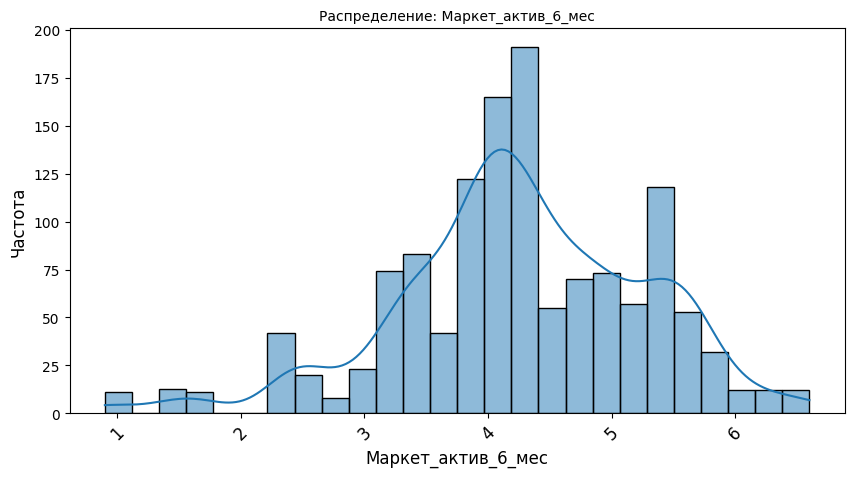

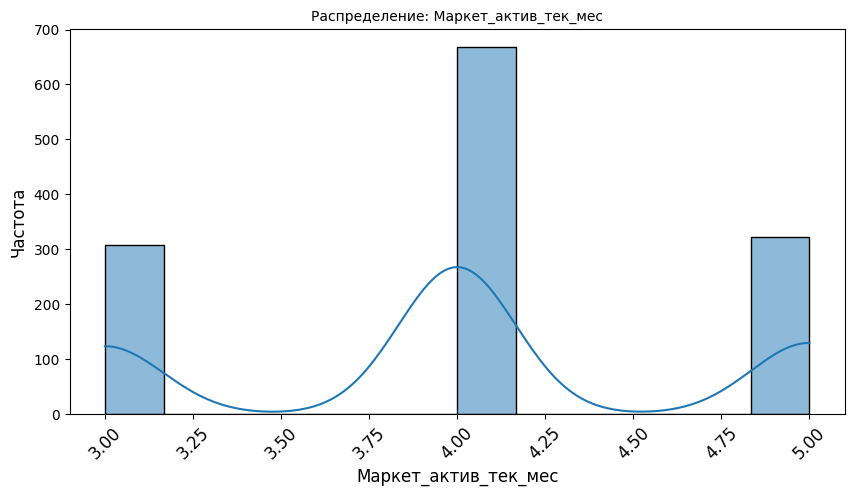

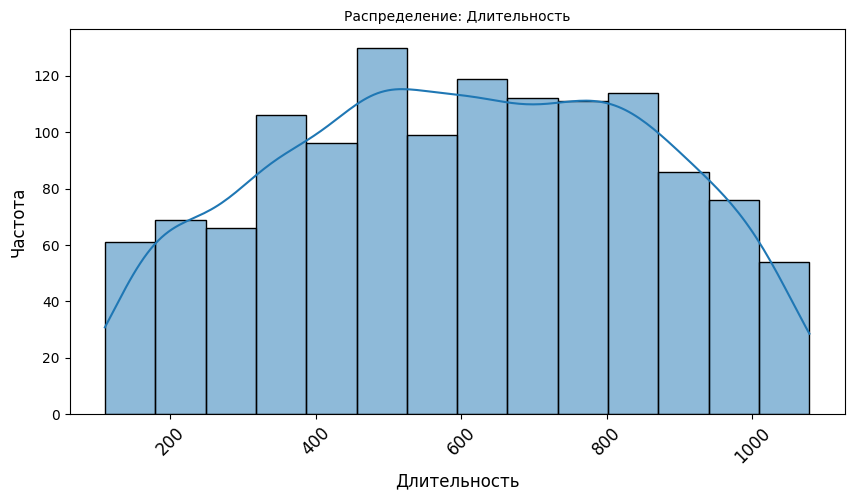

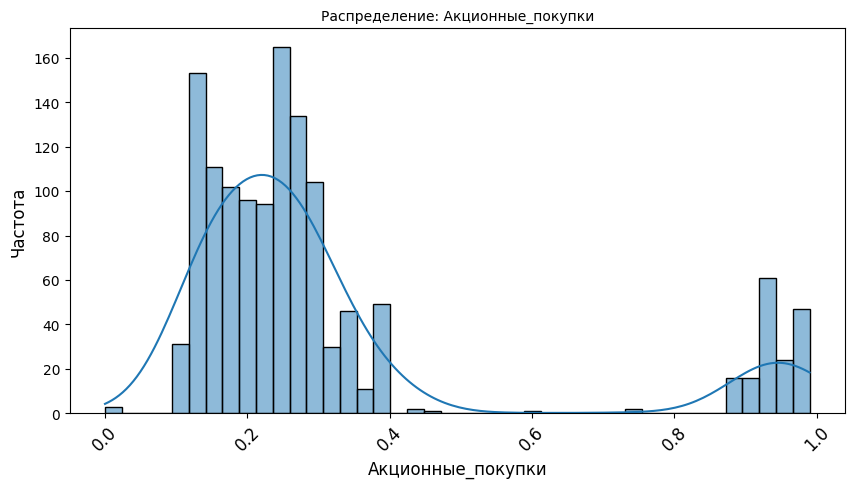

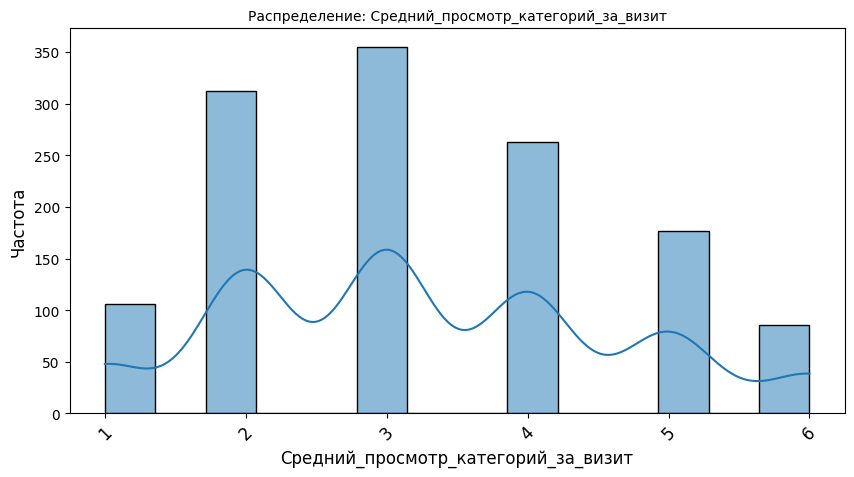

...

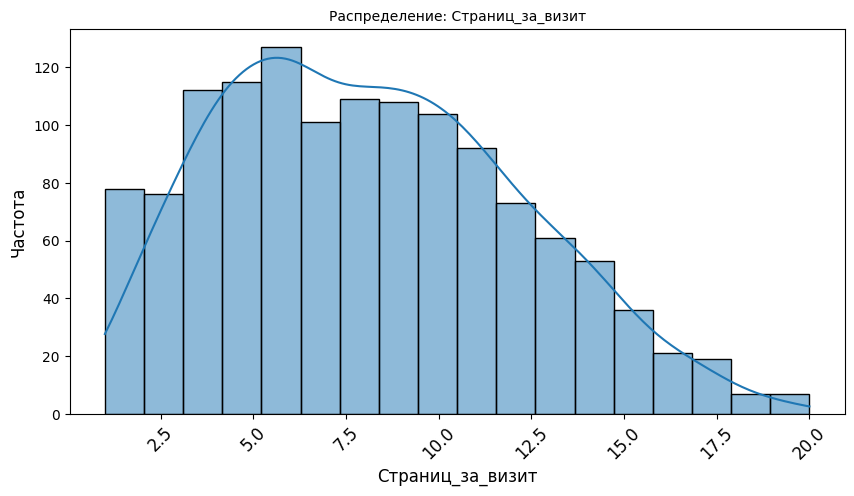

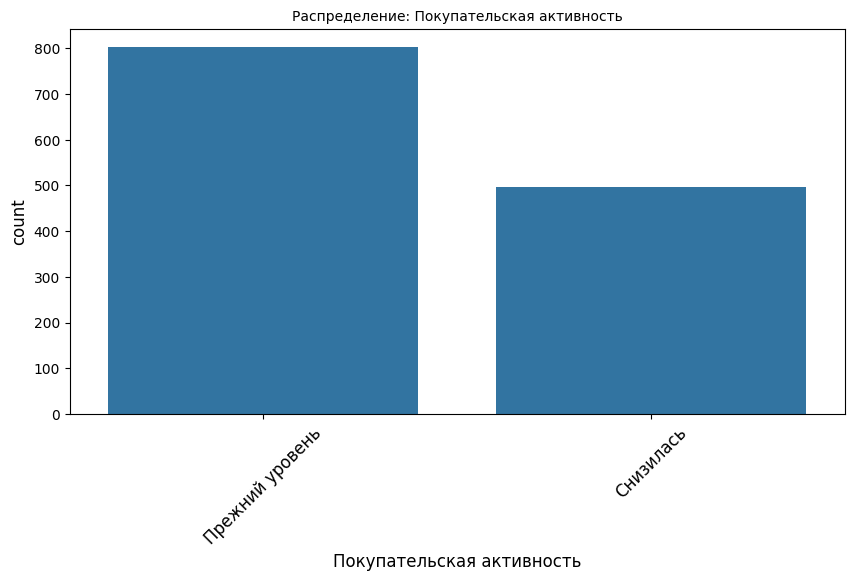

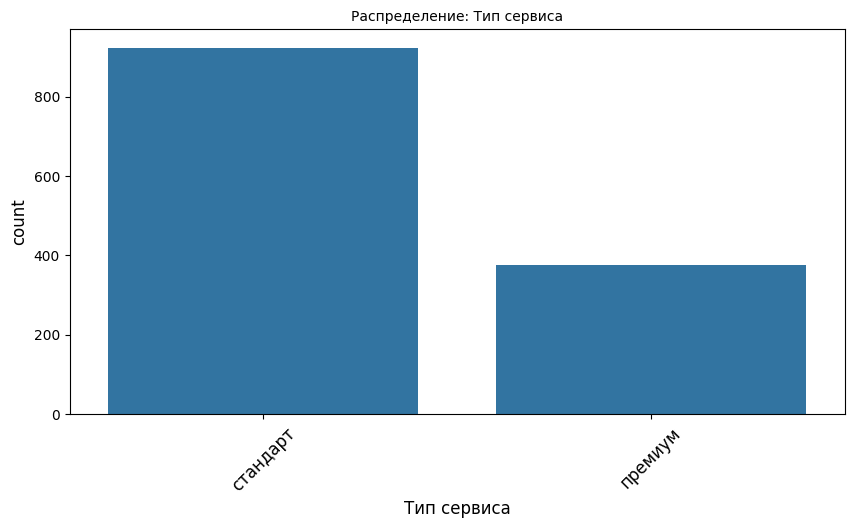

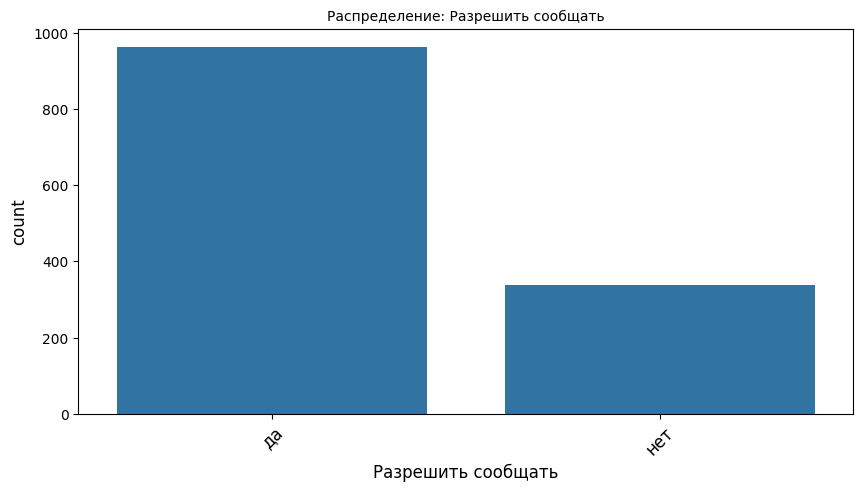

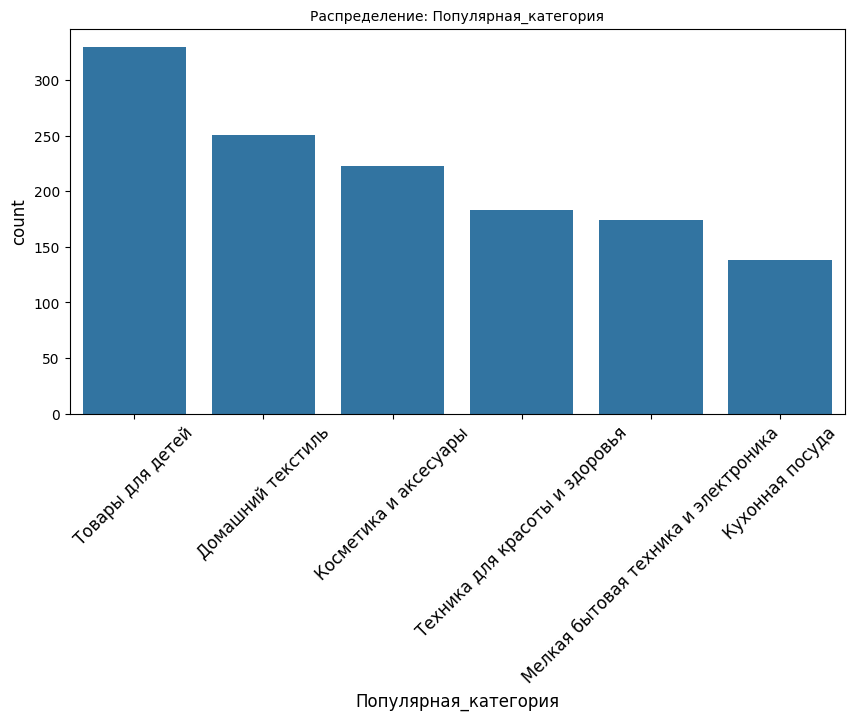

/tmp/ipython-input-2819805577.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df_money2['Прибыль'] > 0]


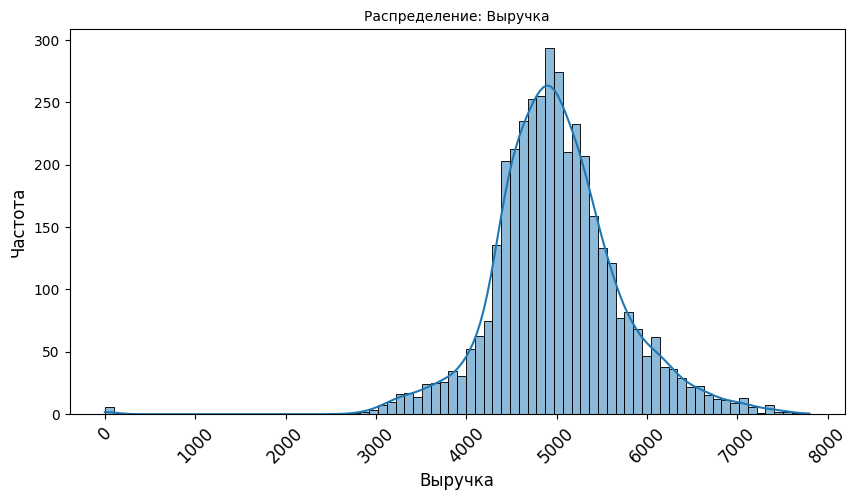

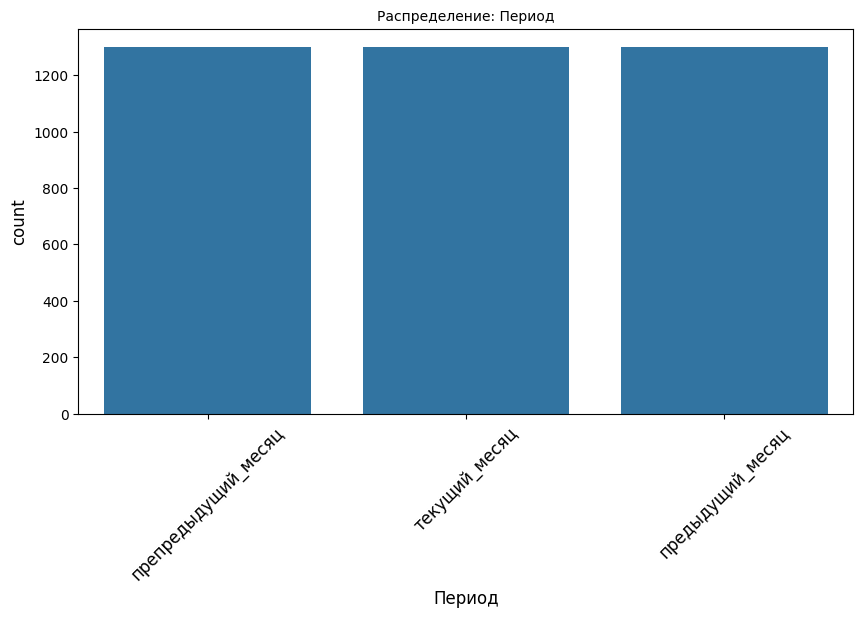

/tmp/ipython-input-2819805577.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df_money2['Прибыль'] > 0]


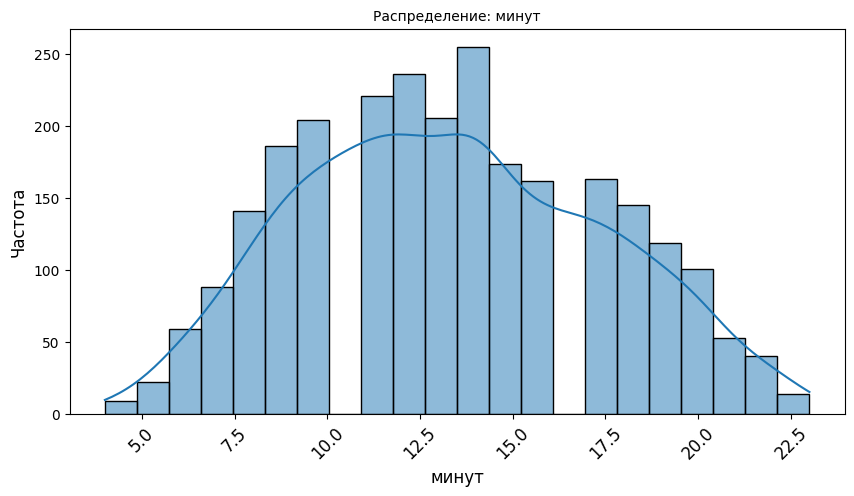

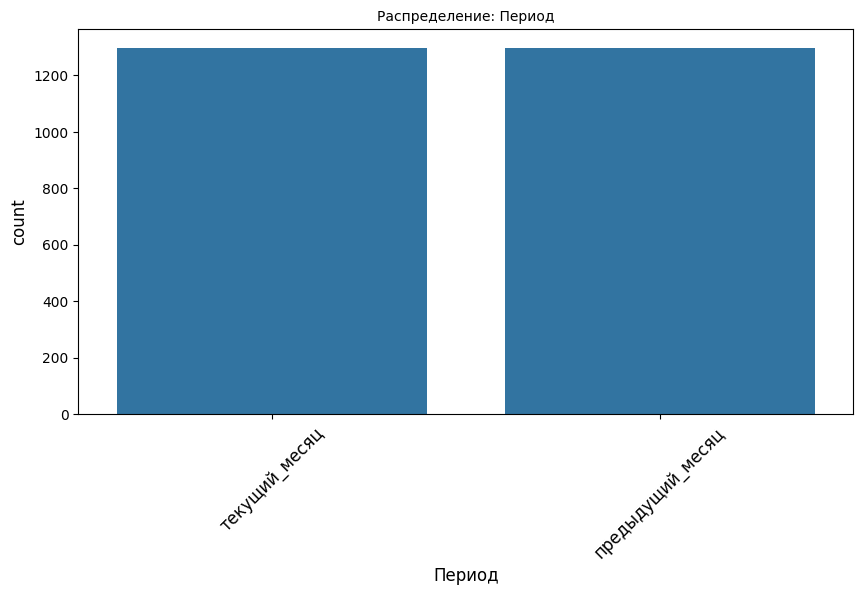

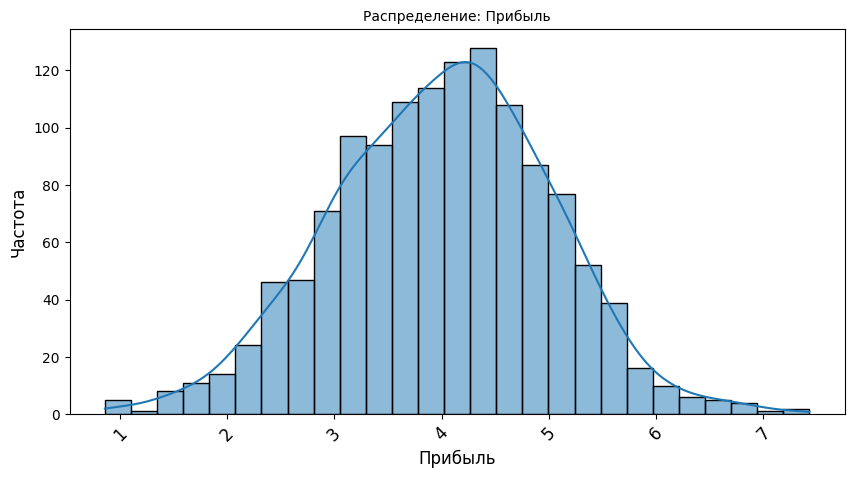

In [131]:
for df in df_list:
    df = df[df_money2['Прибыль'] > 0]

    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numeric_cols:
        plt.figure(figsize=(10, 5))
        sns.histplot(df[col], kde=True)
        plt.title(f'Распределение: {col}')
        plt.xlabel(col)
        plt.ylabel('Частота')
        plt.xticks(rotation=45)
        plt.show()

    categorical_cols = df.select_dtypes(include=['object', 'category']).columns
    for col in categorical_cols:
            plt.figure(figsize=(10, 5))
            sns.countplot(x=col, data=df, order=df[col].value_counts().index)
            plt.title(f'Распределение: {col}')
            plt.xticks(rotation=45)
            plt.show()

В представленных таблицах приведены данные о клиентах с покупательской активностью не менее трёх месяцев.

По результатам исследовательского анализа данных следует вывод, что около у трети последних клиентов покупательная активность снизилась, что может быть обусловлено множеством причин. Также, по результатам исследовательского анализа, выявлена аномалия, а также оишбки в данных, которые предобработанны во 2 шаге.

## Шаг 4. Объединение таблиц
4.1 Объедините таблицы market_file.csv, market_money.csv, market_time.csv. Данные о прибыли из файла money.csv при моделировании вам не понадобятся.
4.2 Учитывайте, что данные о выручке и времени на сайте находятся в одном столбце для всех периодов. В итоговой таблице сделайте отдельный столбец для каждого периода.

In [132]:
display (df_money)

,Период,Выручка
id,,
215348,препредыдущий_месяц,0.0
215348,текущий_месяц,3293.1
215348,предыдущий_месяц,0.0
215349,препредыдущий_месяц,4472.0
215349,текущий_месяц,4971.6
...,...,...
216646,препредыдущий_месяц,4725.0
216646,предыдущий_месяц,4923.0
216647,предыдущий_месяц,4720.0


In [133]:
df_money['Период'].value_counts()

,count
Период,
препредыдущий_месяц,1299
текущий_месяц,1299
предыдущий_месяц,1299


In [134]:
df_time['Период'].value_counts()

,count
Период,
текущий_месяц,1299
предыдущий_месяц,1299


In [135]:
money_wide = df_money.pivot(
    columns='Период',
    values='Выручка'
).add_prefix('Выручка_')

# Преобразование данных о времени
time_wide = df_time.pivot(
    columns='Период',
    values='минут'
).add_prefix('Минут_')

# Объединение всех данных
df_full = df_file.join([money_wide, time_wide], how = 'left')
display (df_full)

,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит,Выручка_предыдущий_месяц,Выручка_препредыдущий_месяц,Выручка_текущий_месяц,Минут_предыдущий_месяц,Минут_текущий_месяц
id,,,,,,,,,,,,,,,,,
215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5,0.0,0.0,3293.1,13,14
215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10
215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13
215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13
215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216643,Прежний уровень,стандарт,да,6.6,3,318,0.24,Техника для красоты и здоровья,5,3,3,11,3664.0,4704.0,4741.7,14,7
216644,Прежний уровень,стандарт,нет,5.1,4,454,0.21,Домашний текстиль,6,2,3,9,4729.0,5299.0,5353.0,12,11
216645,Прежний уровень,стандарт,да,4.1,3,586,0.20,Домашний текстиль,3,2,5,7,5160.0,5334.0,5139.2,12,18


С помощью сводных таблиц, исходные данные преобразованы под размер 1 таблицы, после чего объеденные по индексам. Теперь модель МО может корректно с ними работать.

## Шаг 5. Корреляционный анализ
Проведите корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования. Сделайте выводы о мультиколлинеарности и при необходимости устраните её.

In [136]:
df_Ffull = df_full[(df_full['Выручка_предыдущий_месяц'] > 0) & (df_full['Выручка_препредыдущий_месяц']>0) & (df_full['Выручка_текущий_месяц']>0)]

In [137]:
df_Ffull.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1296 entries, 215349 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Покупательская активность            1296 non-null   object 
 1   Тип сервиса                          1296 non-null   object 
 2   Разрешить сообщать                   1296 non-null   object 
 3   Маркет_актив_6_мес                   1296 non-null   float64
 4   Маркет_актив_тек_мес                 1296 non-null   int64  
 5   Длительность                         1296 non-null   int64  
 6   Акционные_покупки                    1296 non-null   float64
 7   Популярная_категория                 1296 non-null   object 
 8   Средний_просмотр_категорий_за_визит  1296 non-null   int64  
 9   Неоплаченные_продукты_штук_квартал   1296 non-null   int64  
 10  Ошибка_сервиса                       1296 non-null   int64  
 11  Страниц_за_визит            

In [138]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1299 entries, 215348 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Покупательская активность            1299 non-null   object 
 1   Тип сервиса                          1299 non-null   object 
 2   Разрешить сообщать                   1299 non-null   object 
 3   Маркет_актив_6_мес                   1299 non-null   float64
 4   Маркет_актив_тек_мес                 1299 non-null   int64  
 5   Длительность                         1299 non-null   int64  
 6   Акционные_покупки                    1299 non-null   float64
 7   Популярная_категория                 1299 non-null   object 
 8   Средний_просмотр_категорий_за_визит  1299 non-null   int64  
 9   Неоплаченные_продукты_штук_квартал   1299 non-null   int64  
 10  Ошибка_сервиса                       1299 non-null   int64  
 11  Страниц_за_визит            

In [139]:
numeric_cols = df_Ffull.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df_Ffull.select_dtypes(include=['object', 'category']).columns

corr_phik = df_Ffull.phik_matrix(interval_cols=numeric_cols)

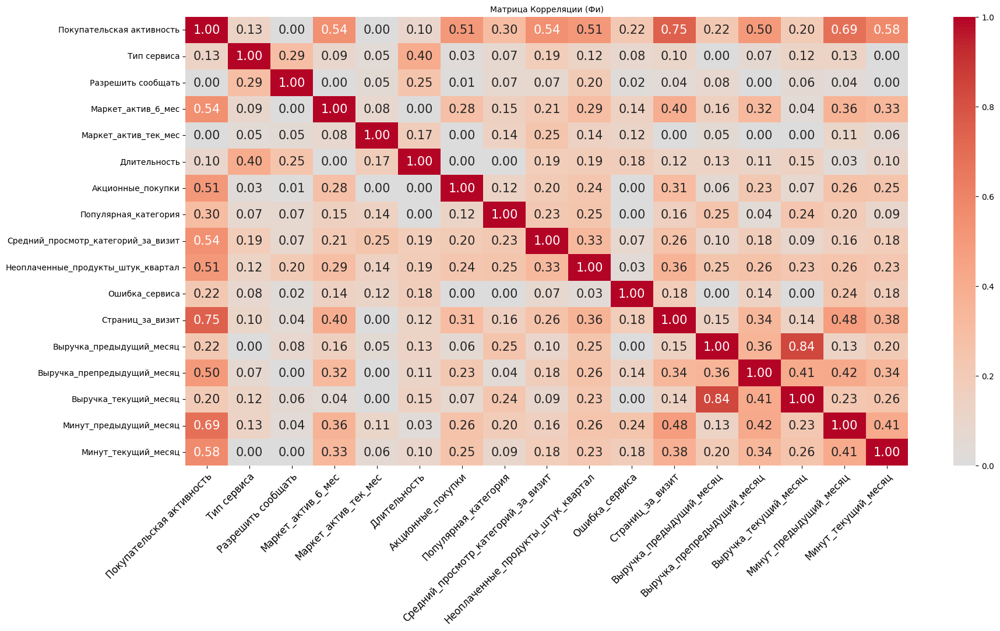

In [140]:
plt.figure(figsize=(20, 10))
ax = sns.heatmap(corr_phik, annot=True, cmap='coolwarm', center=0, annot_kws={'size': 15}, fmt='.2f')
plt.title('Матрица Корреляции (Фи)')

ax.set_xticklabels(ax.get_xticklabels(),
                      rotation=45,
                      ha='right',
                      rotation_mode='anchor') # обычная ротация не подходит, так как наименования съезжают. Поэтому испольузуется такой метод.

plt.show()

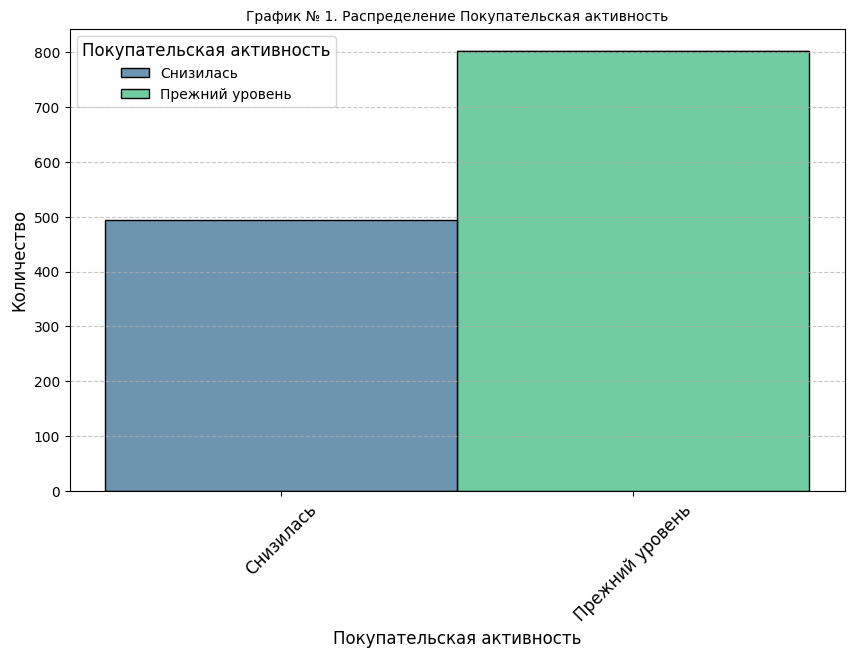

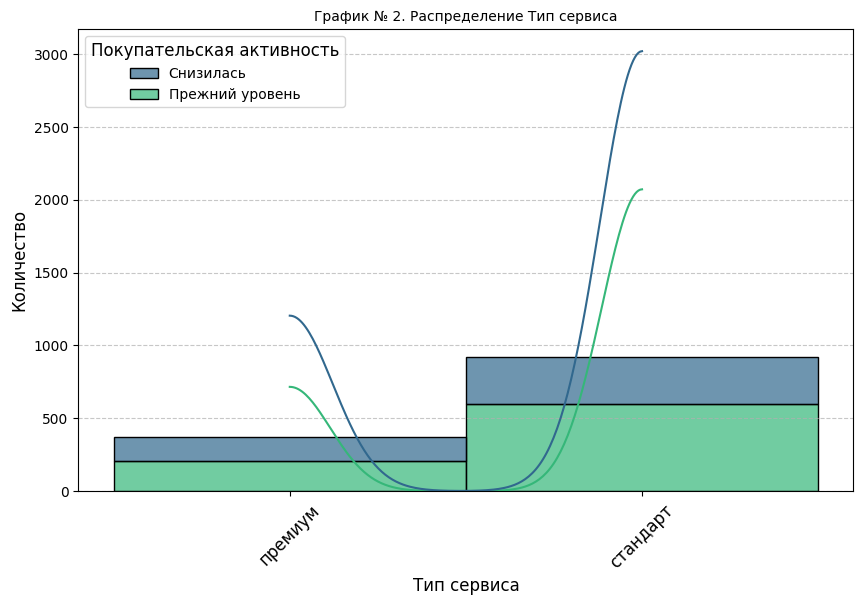

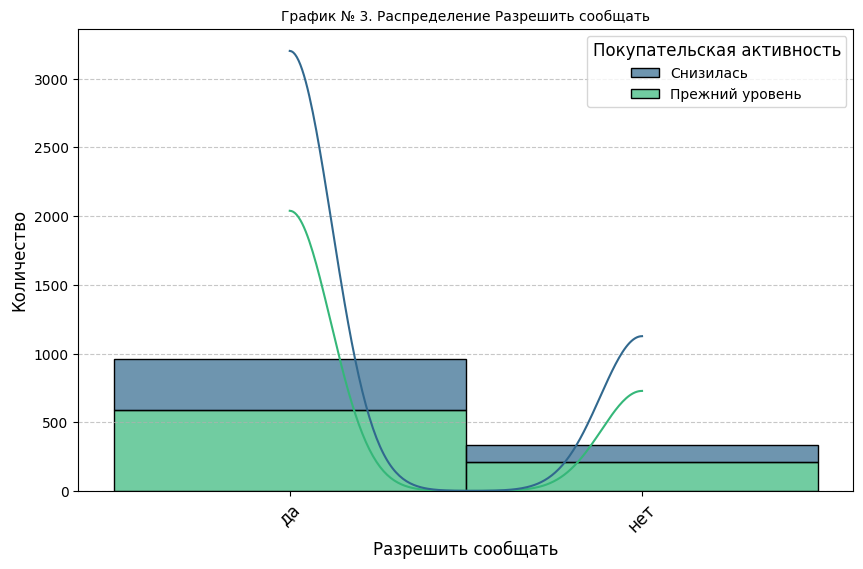

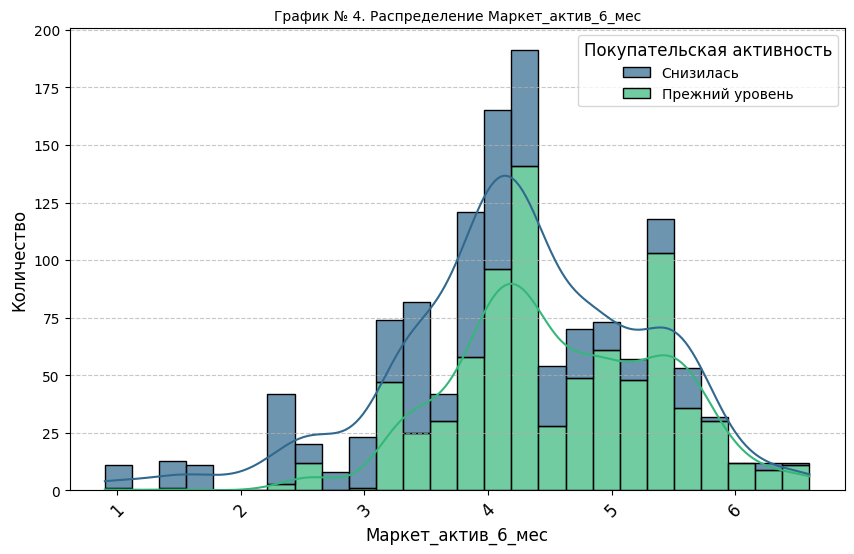

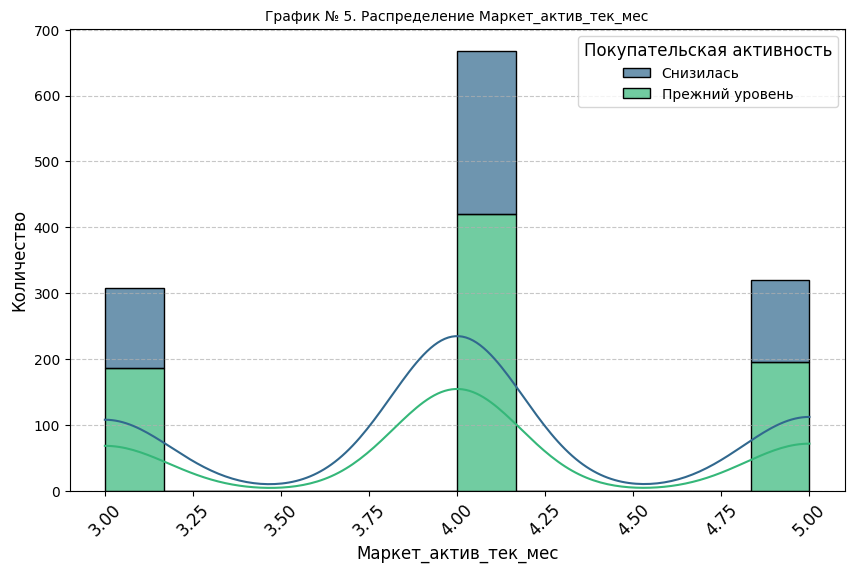

...

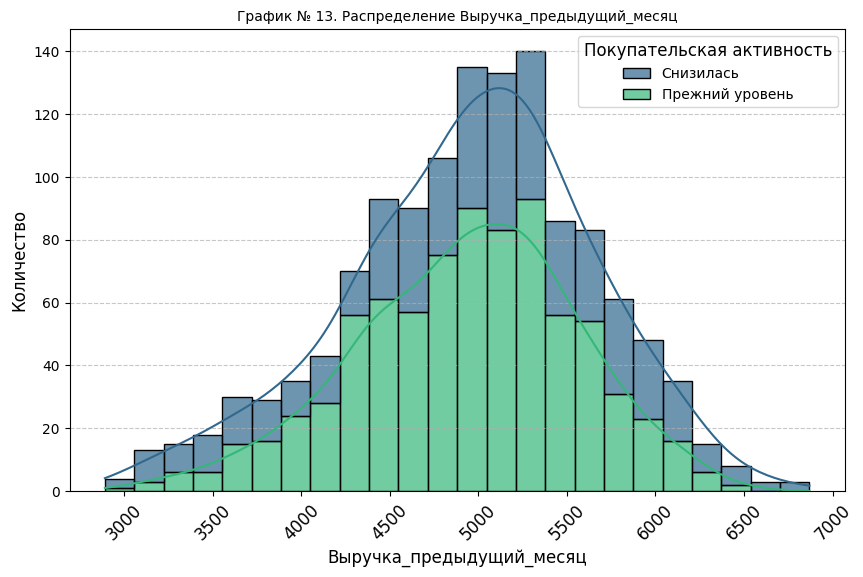

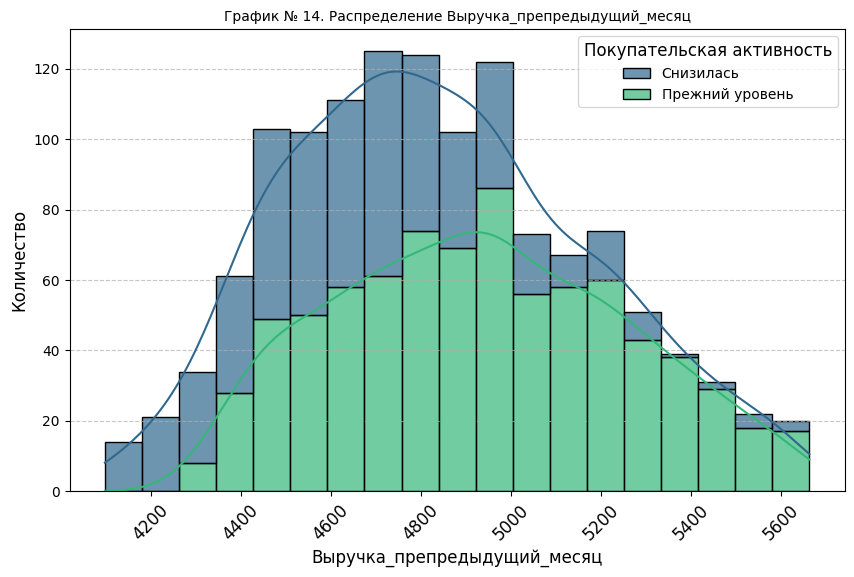

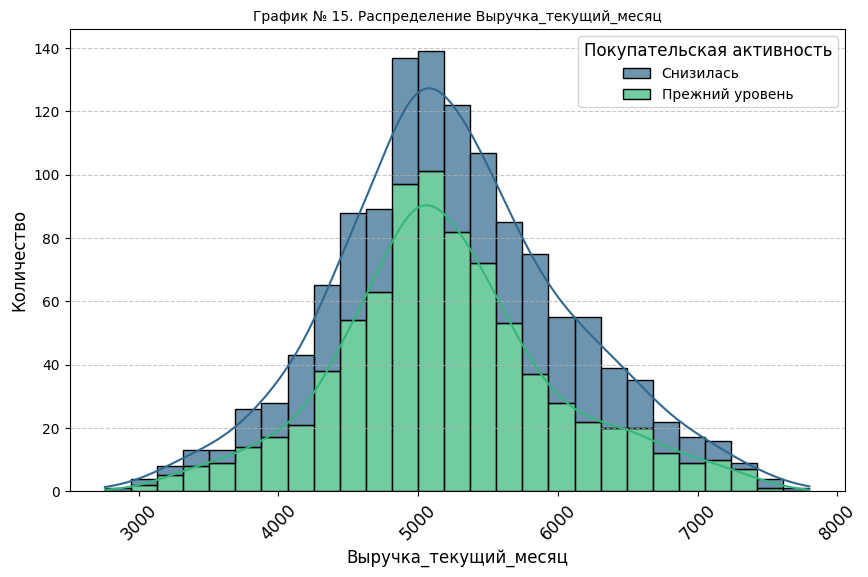

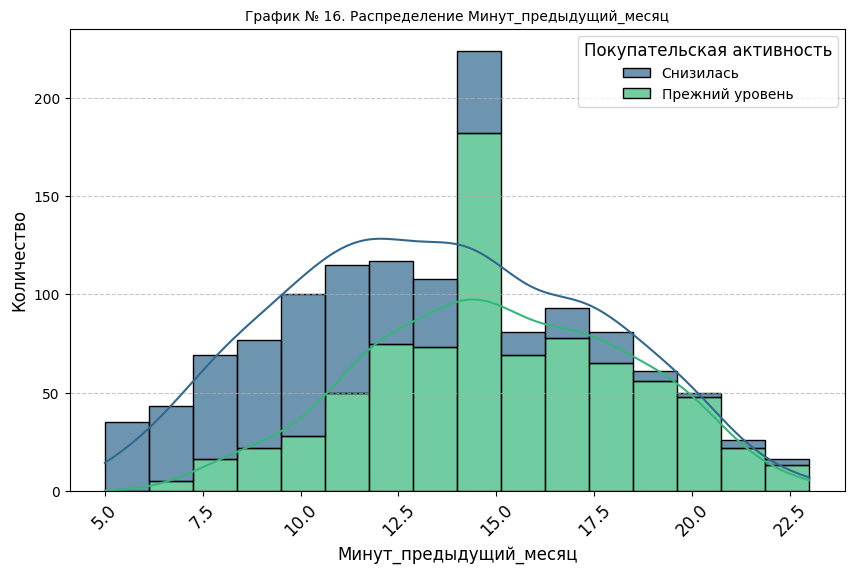

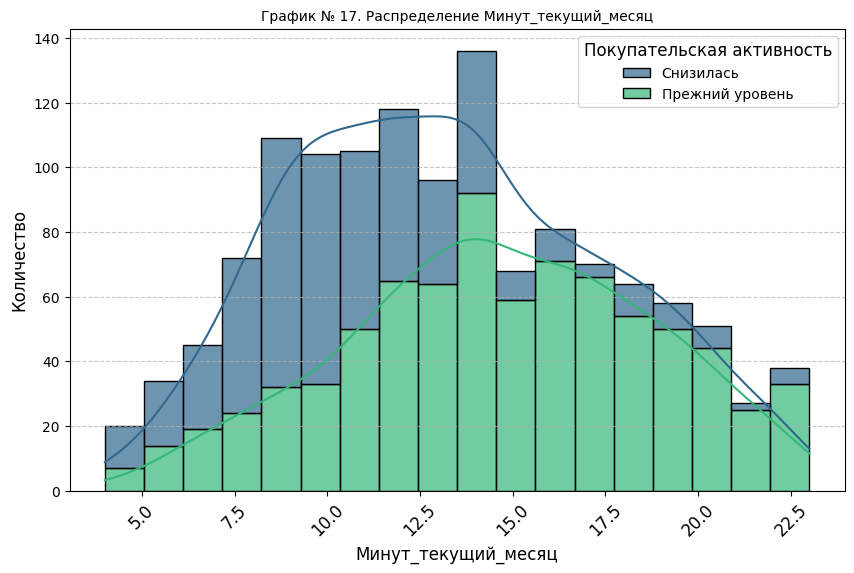

In [141]:
count_plot = 0
for col in df_Ffull.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(
        data=df_Ffull,
        x=col,           # Анализируемый признак
        hue='Покупательская активность',    # Столбец-таргет (бинарный: 0/1)
        multiple='stack',  # Вариант наложения: 'stack', 'dodge', 'layer', 'fill'
        kde=True,          # Добавить сглаживающую кривую
        palette='viridis', # Цветовая схема
        alpha=0.7,         # Прозрачность (для 'layer')
        edgecolor='black'  # Границы столбцов
    )

    # Настройка оформления
    plt.title(f'График № {count_plot+1}. Распределение {col}')
    plt.xlabel(f'{col}')
    plt.ylabel('Количество')
      # Кастомизация легенды
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=45)
    plt.show()
    count_plot +=1

Портрет пользователя, активность которого упадет:

График 4 - активность за 6 месяцев от 3 и менее месяцев;

График 7 - немного от общего распределения выделаяются акционные покупки;

График 10 - неоплаченные продукты за квартал от 6 и более;

График 12 - Пользователи, просматривающие менее 5 страниц за визит, скорее всего снизят свою покупательсткую активность;

График 14 - выручка за предыдущий месяц 4200 и меньше. Минут за предыдущий месяц меньше 5;

Других отличий от распределения пользователей с прежним уровнем активности не обнаружил.


## Шаг 6. Использование пайплайнов
Примените все изученные модели. Для этого используйте пайплайны. <br><br>
6.1 Во время подготовки данных используйте ColumnTransformer. Количественные и категориальные признаки обработайте в пайплайне раздельно. Для кодирования категориальных признаков используйте как минимум два кодировщика, для масштабирования количественных — как минимум два скейлера. <br>
Напоминаем, что для каждой модели можно подготовить данные с разным кодированием и масштабированием. <br><br>
6.2 Обучите четыре модели: KNeighborsClassifier(), DecisionTreeClassifier(), LogisticRegression() и  SVC(). Для каждой из них подберите как минимум один гиперпараметр. Выберите подходящую для задачи метрику, аргументируйте свой выбор. Используйте эту метрику при подборе гиперпараметров. <br><br>
6.3 Выберите лучшую модель, используя заданную метрику. Для этого примените одну из стратегий: <br>

   использовать пайплайны и инструменты подбора гиперпараметров для каждой модели отдельно, чтобы выбрать лучшую модель самостоятельно; <br>
   использовать один общий пайплайн для всех моделей и инструмент подбора гиперпараметров, который вернёт вам лучшую модель. <br>

In [142]:
df_full.columns

Index(['Покупательская активность', 'Тип сервиса', 'Разрешить сообщать',
       'Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность',
       'Акционные_покупки', 'Популярная_категория',
       'Средний_просмотр_категорий_за_визит',
       'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса',
       'Страниц_за_визит', 'Выручка_предыдущий_месяц',
       'Выручка_препредыдущий_месяц', 'Выручка_текущий_месяц',
       'Минут_предыдущий_месяц', 'Минут_текущий_месяц'],
      dtype='object')

In [143]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1299 entries, 215348 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Покупательская активность            1299 non-null   object 
 1   Тип сервиса                          1299 non-null   object 
 2   Разрешить сообщать                   1299 non-null   object 
 3   Маркет_актив_6_мес                   1299 non-null   float64
 4   Маркет_актив_тек_мес                 1299 non-null   int64  
 5   Длительность                         1299 non-null   int64  
 6   Акционные_покупки                    1299 non-null   float64
 7   Популярная_категория                 1299 non-null   object 
 8   Средний_просмотр_категорий_за_визит  1299 non-null   int64  
 9   Неоплаченные_продукты_штук_квартал   1299 non-null   int64  
 10  Ошибка_сервиса                       1299 non-null   int64  
 11  Страниц_за_визит            

In [144]:
df_full['Популярная_категория'].value_counts()

,count
Популярная_категория,
Товары для детей,330
Домашний текстиль,251
Косметика и аксесуары,223
Техника для красоты и здоровья,183
Мелкая бытовая техника и электроника,174
Кухонная посуда,138


In [145]:
RANDOM_STATE = 42
TEST_SIZE = 0.25


X_train, X_test, y_train, y_test = train_test_split(
    df_full.drop('Покупательская активность', axis=1),
    df_full['Покупательская активность'],
    test_size = TEST_SIZE,
    random_state = RANDOM_STATE,
    stratify = df_full['Покупательская активность'])

# создаём списки с названиями признаков
ohe_columns = ['Разрешить сообщать','Популярная_категория']
ord_columns = ['Тип сервиса']
num_columns = df_full.select_dtypes(include=['int64', 'float64']).columns

# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False, ))
    ]
)

# создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['стандарт', 'премиум'],
                ],
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', MinMaxScaler(), num_columns)
    ],
    remainder='passthrough'
)

# создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])



param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2,9),
        'models__max_features': range(2,9),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели KNeighborsClassifier()
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2,8),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE,
            solver='liblinear',
            penalty='l1'
        )],
        'models__C': range(1,8),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },
    {
        'models': [SVC(
            random_state=RANDOM_STATE, probability=True
        )],
        'models__degree': range(3,7),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

random_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=5,
    scoring='roc_auc',
    random_state=RANDOM_STATE,
    n_jobs=-1,
    n_iter=55
)
random_search.fit(X_train, y_train)

print('Лучшая модель и её параметры:\n\n', random_search.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', random_search.best_score_)

# проверьте работу модели на тестовой выборке
# рассчитайте прогноз на тестовых данных
y_test_pred = random_search.best_estimator_.predict_proba(X_test)[:,1]
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test, y_test_pred)}')

""",
    {
        'models': [RandomForestClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2,9),
        'models__max_features': range(2,9),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    } - пока не подходит, так как сломалась вся интерпретируемость признаков"""

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['Разрешить сообщать',
                                                   'Популярная_категория']),
                                                 ('ord',
                                 

",\n    {\n        'models': [RandomForestClassifier(random_state=RANDOM_STATE)],\n        'models__max_depth': range(2,9),\n        'models__max_features': range(2,9),\n        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']\n    } - пока не подходит, так как сломалась вся интерпретируемость признаков"

Методом случаного поиска гиперпараметров и модели получена лучшая модель LogisticRegression с уровнем l1 ругляризации C=3
Качество модели на метрике ROC-AUC составило 0.91. Указанная метрика выбрана, так как имеется дисбаланс классов, к которому она не чувствительна.

## Шаг 7. Анализ важности признаков
7.1 Оцените важность признаков для лучшей модели и постройте график важности с помощью метода SHAP.
7.2 Сделайте выводы о значимости признаков:

    какие признаки мало значимы для модели;
    какие признаки сильнее всего влияют на целевой признак;
    как можно использовать эти наблюдения при моделировании и принятии бизнес-решений.

In [146]:
X_train_2 = pipe_final.named_steps['preprocessor'].fit_transform(X_train)

best_model = random_search.best_estimator_.named_steps['models']

if isinstance(best_model, (LogisticRegression)):
    explainer = shap.LinearExplainer(best_model, X_train_2)
elif isinstance(best_model, (DecisionTreeClassifier, RandomForestClassifier)):
    explainer = shap.TreeExplainer(best_model)
else:
    # Универсальный explainer для других моделей
    explainer = shap.Explainer(best_model, X_train_2)

X_test_2 = pipe_final.named_steps['preprocessor'].transform(X_test)

feature_names = pipe_final.named_steps['preprocessor'].get_feature_names_out()
X_test_2 = pd.DataFrame(X_test_2, columns=feature_names)

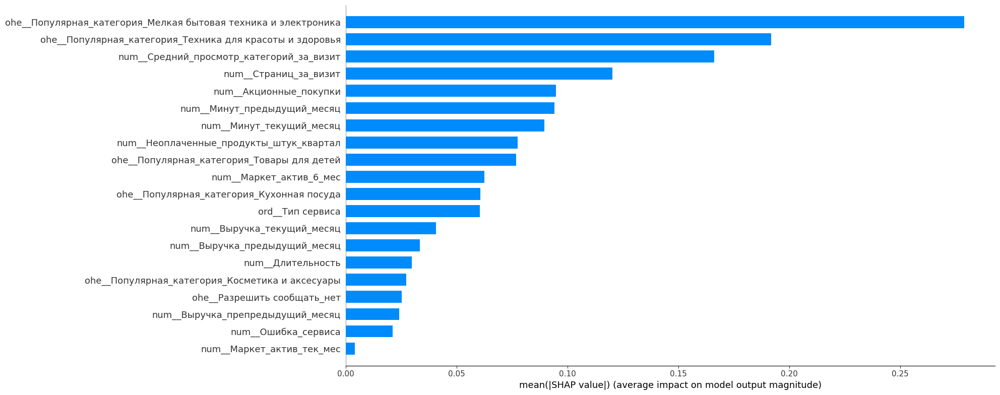

In [147]:
shap_values = explainer(X_test_2)

plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 10,
    'axes.labelsize': 12,
    'xtick.labelsize': 12,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 16
})


shap.summary_plot(
    shap_values,
    X_test_2,
    plot_type="bar",
    plot_size=(20, 8)
)

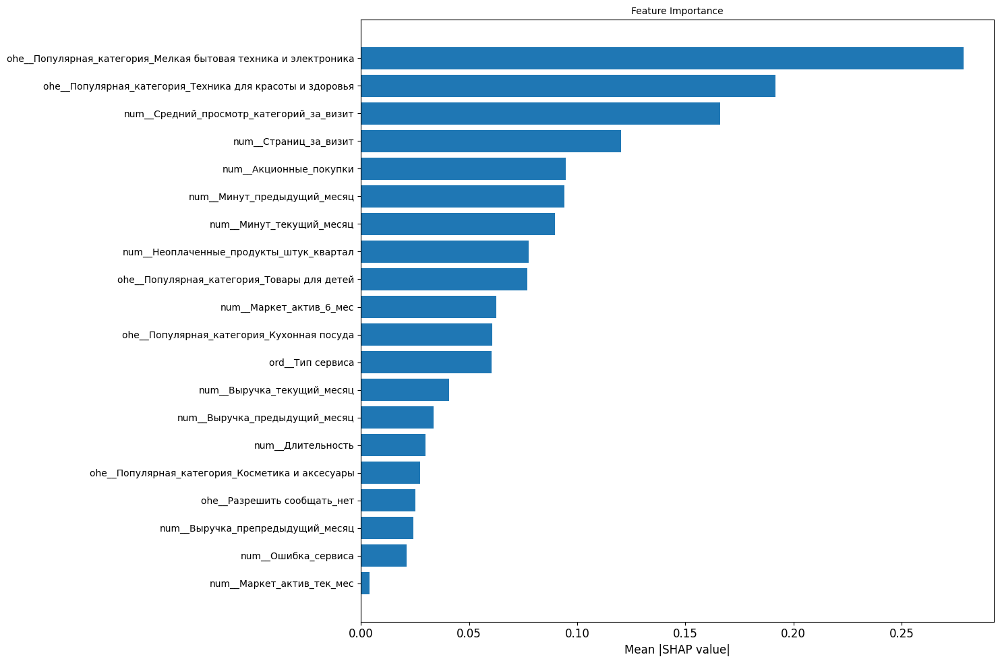

In [148]:
shap_values = explainer(X_test_2)

# Создайте свой собственный bar plot
import numpy as np

# Вычислите средние абсолютные значения SHAP
shap_abs = np.abs(shap_values.values).mean(0)
feature_names = X_test_2.columns
sorted_idx = np.argsort(shap_abs)[::-1]

# Создайте кастомный график
plt.figure(figsize=(15, 10))
plt.barh(range(len(sorted_idx[:20])), shap_abs[sorted_idx[:20]])
plt.yticks(range(len(sorted_idx[:20])), [feature_names[i] for i in sorted_idx[:20]])
plt.xlabel('Mean |SHAP value|')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

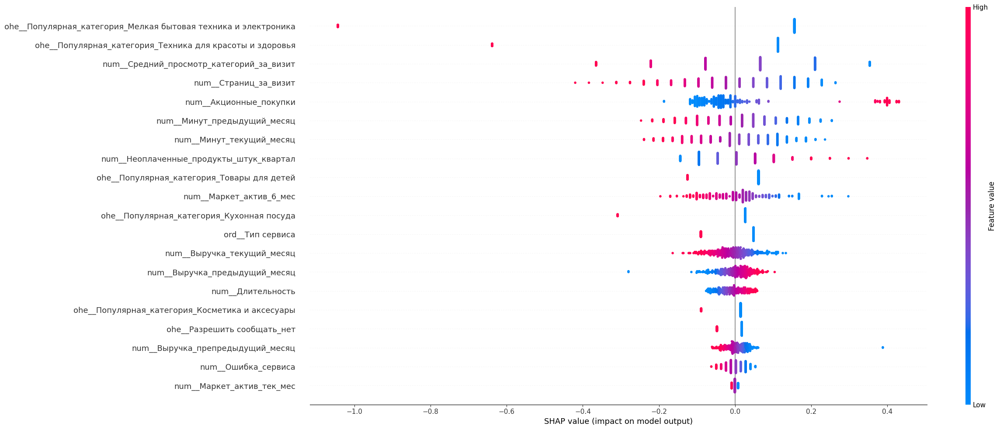

In [149]:
shap.summary_plot(
    shap_values,
    X_test_2,
    plot_type="dot",
    max_display=30,
    plot_size=(25, 10)
)

plt.show()

Изучены shap значения признаков. По результатам следуют выводы:
Пользователи, вероятность снижения активности которых будет низкой:
1. Популярная категория мелкая бытовая техника и электроника - свидетельствует о маловероятном снижении пользовательской активности. Эта категория является одной из самых значимых в предсказании модели.
2. Большое количество просмотров категорий за визит также говорит о маловерятном снижении активности.
3. Техника для красоты и здоровья.

Пользователи, вероятность снижения активности которых будет высокой:
1. Совершающие покупки по акциям;
2. С неполаченными товарами за квартал;
3. С поплуярной категорией "домашиний текстиль"
4. Длительное время пребывающие на сайте.

## Шаг 8. Сегментация покупателей
8.1 Выполните сегментацию покупателей. Используйте результаты моделирования и данные о прибыльности покупателей. <br>
8.2 Выберите группу покупателей и предложите, как увеличить её покупательскую активность:

    Проведите графическое и аналитическое исследование группы покупателей.
    Сделайте предложения по работе с сегментом для увеличения покупательской активности.

8.3 Сделайте выводы о сегментах:

    какой сегмент вы взяли для дополнительного исследования,
    какие предложения вы сделали и почему.

Для выбора сегмента, полагаю целесообразным повторно осмотреть данные и выбрать из них самый привлекатльный.

In [150]:
y_test_proba = random_search.best_estimator_.predict_proba(X_test)[:,1]
y_train_proba = random_search.best_estimator_.predict_proba(X_train)[:,1]

In [151]:
X_test_full = X_test.copy()
X_train_full = X_train.copy()
X_test_full['вероятность_снижения'] = y_test_proba
X_train_full['вероятность_снижения'] = y_train_proba
df_full = pd.concat([X_train_full, X_test_full])

#df_money2 = df_money2.set_index('id')
df_full = df_full.join(df_money2)

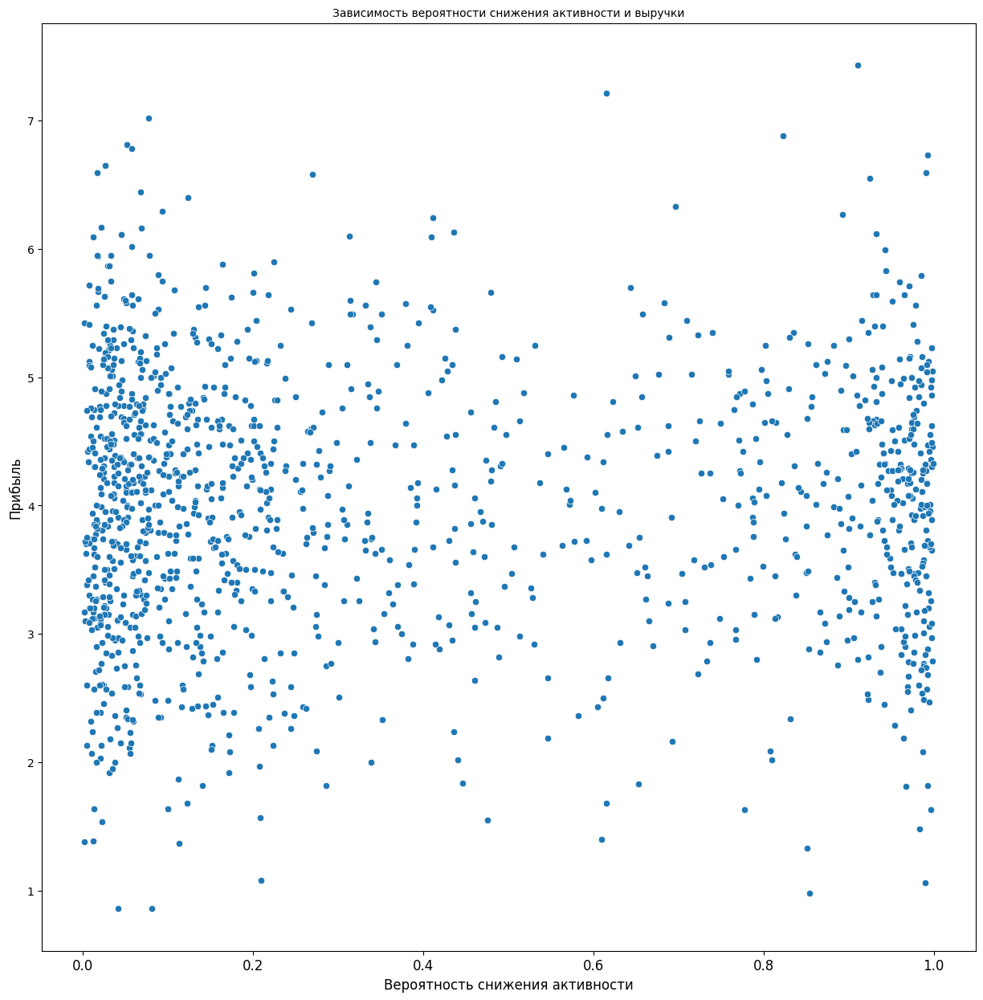

In [152]:
fig = plt.figure(figsize=(15,15))
sns.scatterplot(data=df_full, y='Прибыль', x='вероятность_снижения')
plt.xlabel('Вероятность снижения активности')
plt.ylabel('Прибыль')
plt.title('Зависимость вероятности снижения активности и выручки')
plt.show()

Никакой связи не наблюдаю. Ожидалось, что снижение активности приведет к снижению прибыли, но такой связи нет

<div class="alert alert-info">
<b></b>
</div>

In [153]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1299 entries, 215569 to 215396
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Тип сервиса                          1299 non-null   object 
 1   Разрешить сообщать                   1299 non-null   object 
 2   Маркет_актив_6_мес                   1299 non-null   float64
 3   Маркет_актив_тек_мес                 1299 non-null   int64  
 4   Длительность                         1299 non-null   int64  
 5   Акционные_покупки                    1299 non-null   float64
 6   Популярная_категория                 1299 non-null   object 
 7   Средний_просмотр_категорий_за_визит  1299 non-null   int64  
 8   Неоплаченные_продукты_штук_квартал   1299 non-null   int64  
 9   Ошибка_сервиса                       1299 non-null   int64  
 10  Страниц_за_визит                     1299 non-null   int64  
 11  Выручка_предыдущий_месяц    

In [154]:
num_cols = df_full.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df_full.select_dtypes(include=['object']).columns
target_col = df_full['вероятность_снижения']


In [155]:
num_cols = num_cols.drop('вероятность_снижения')

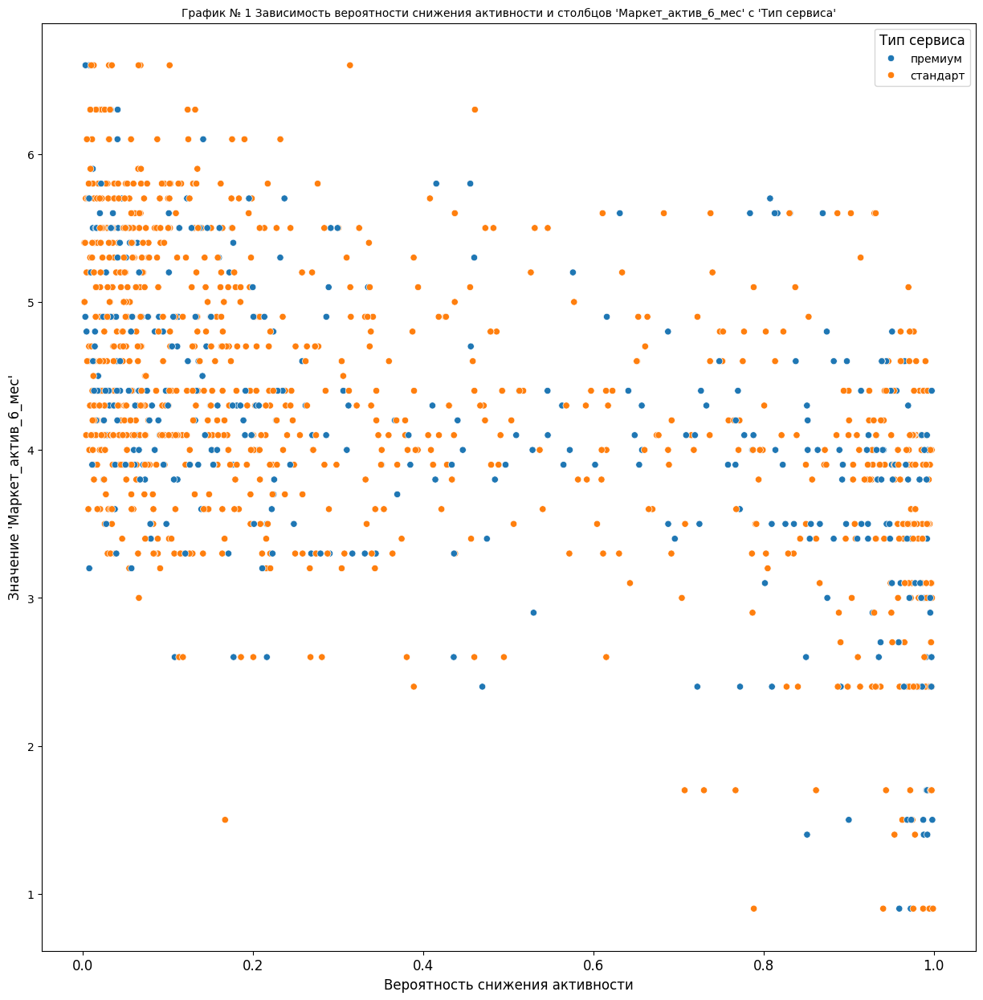

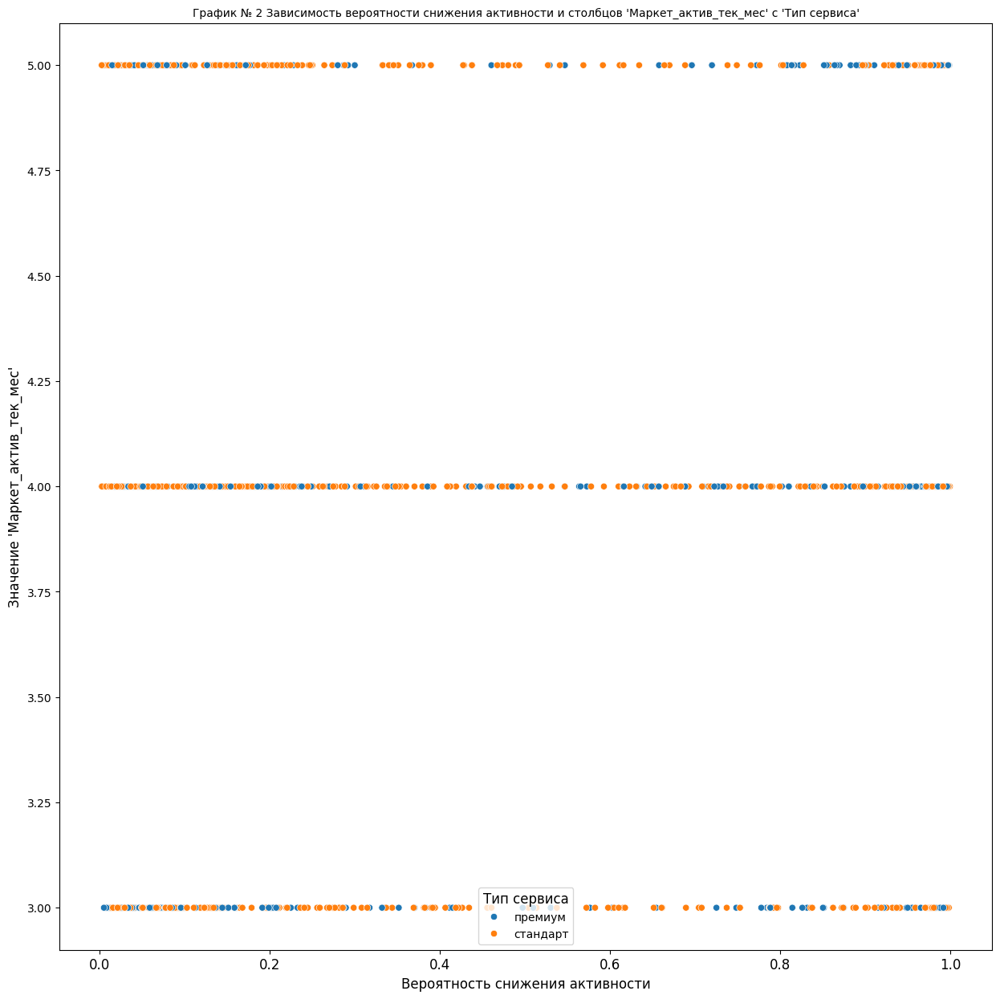

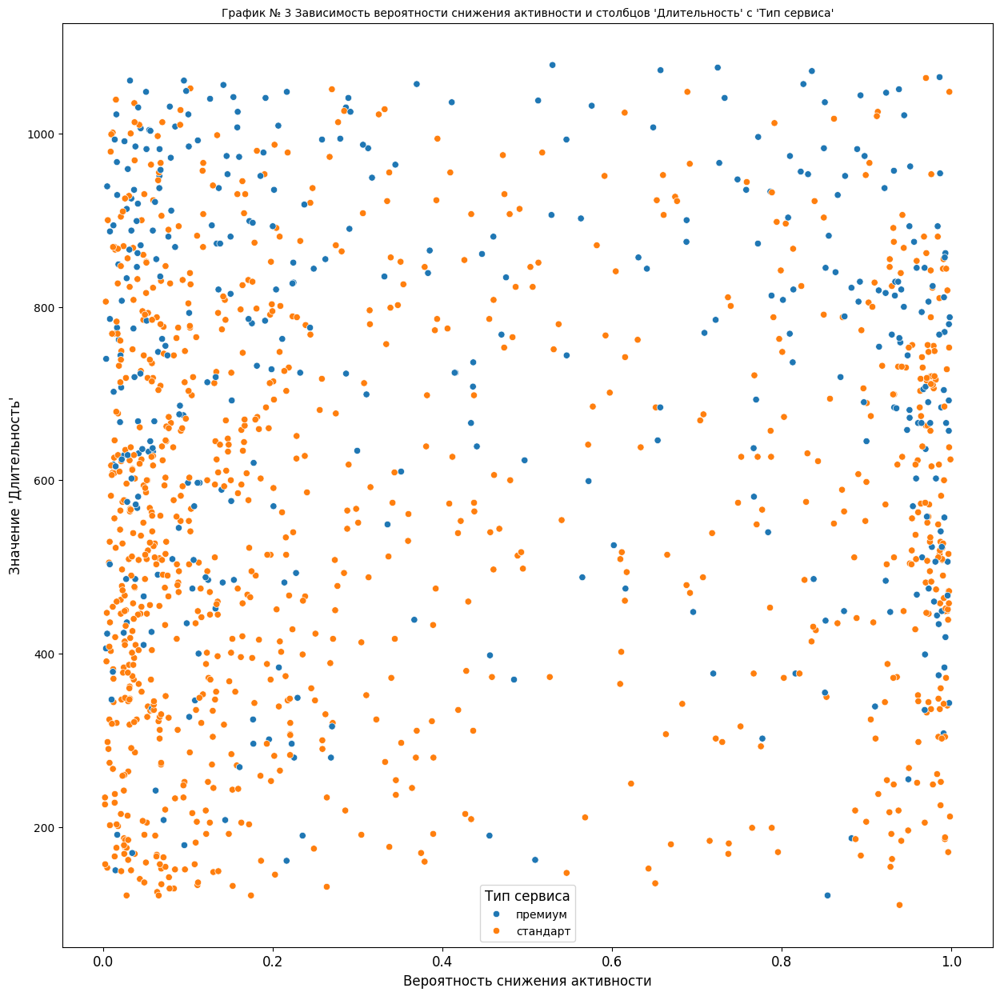

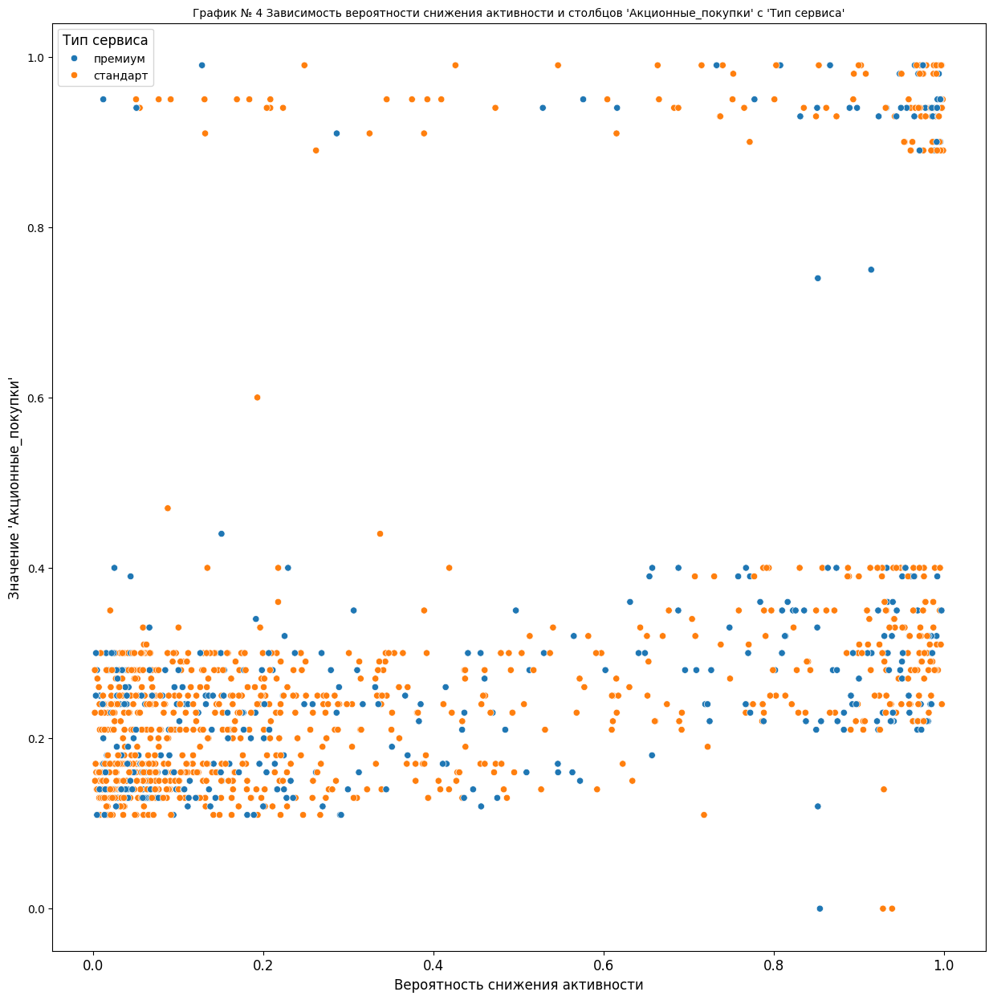

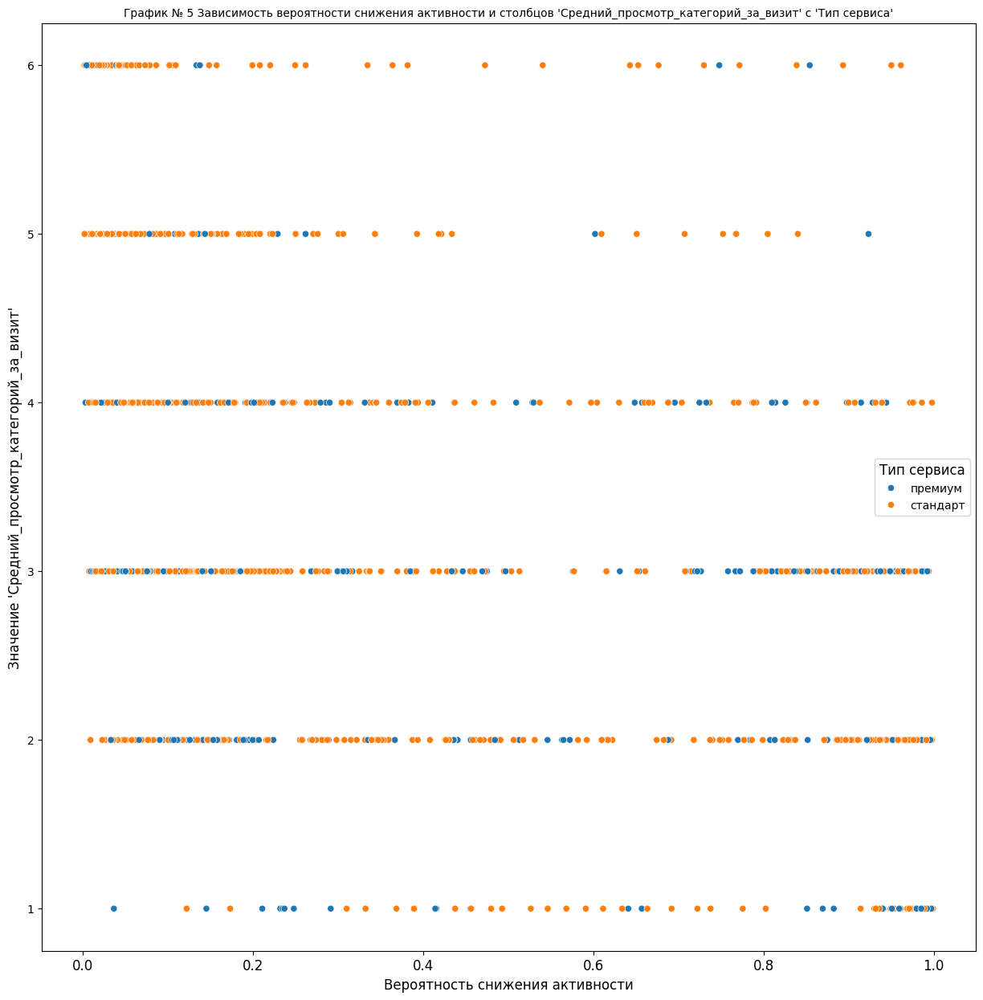

...

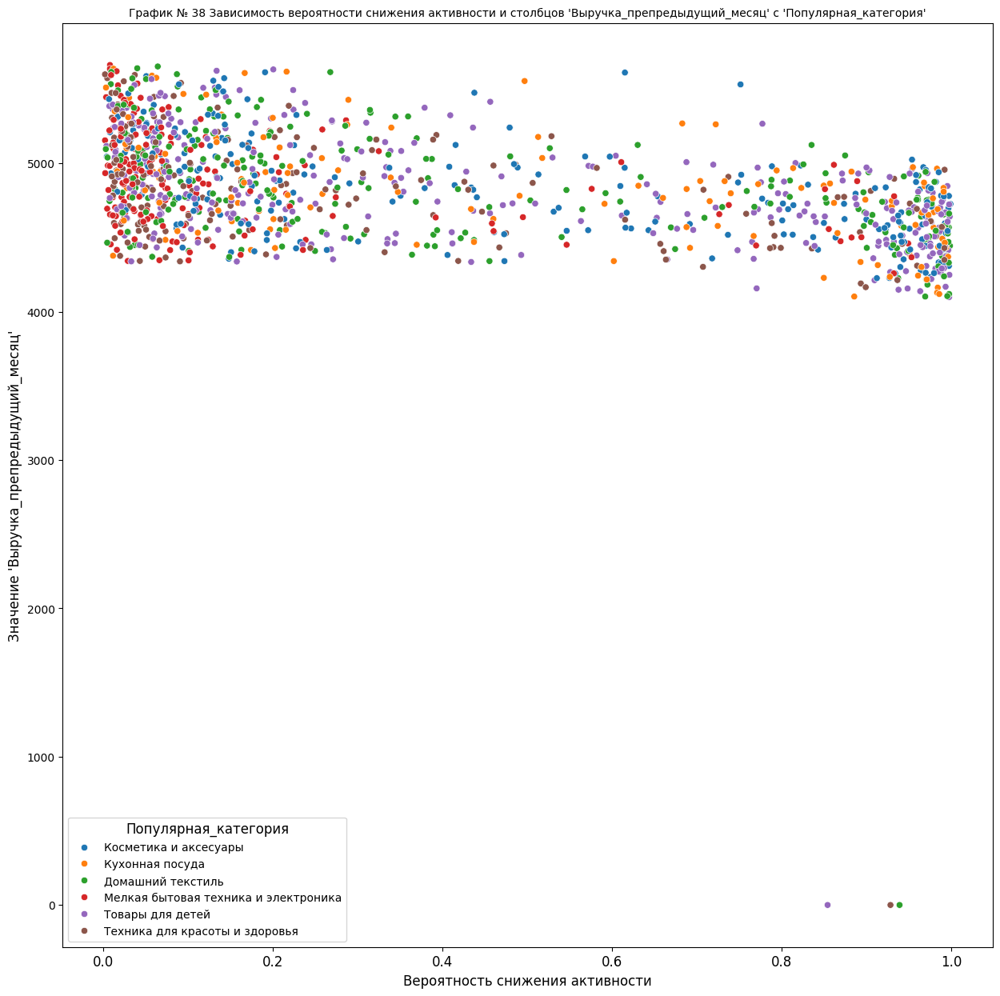

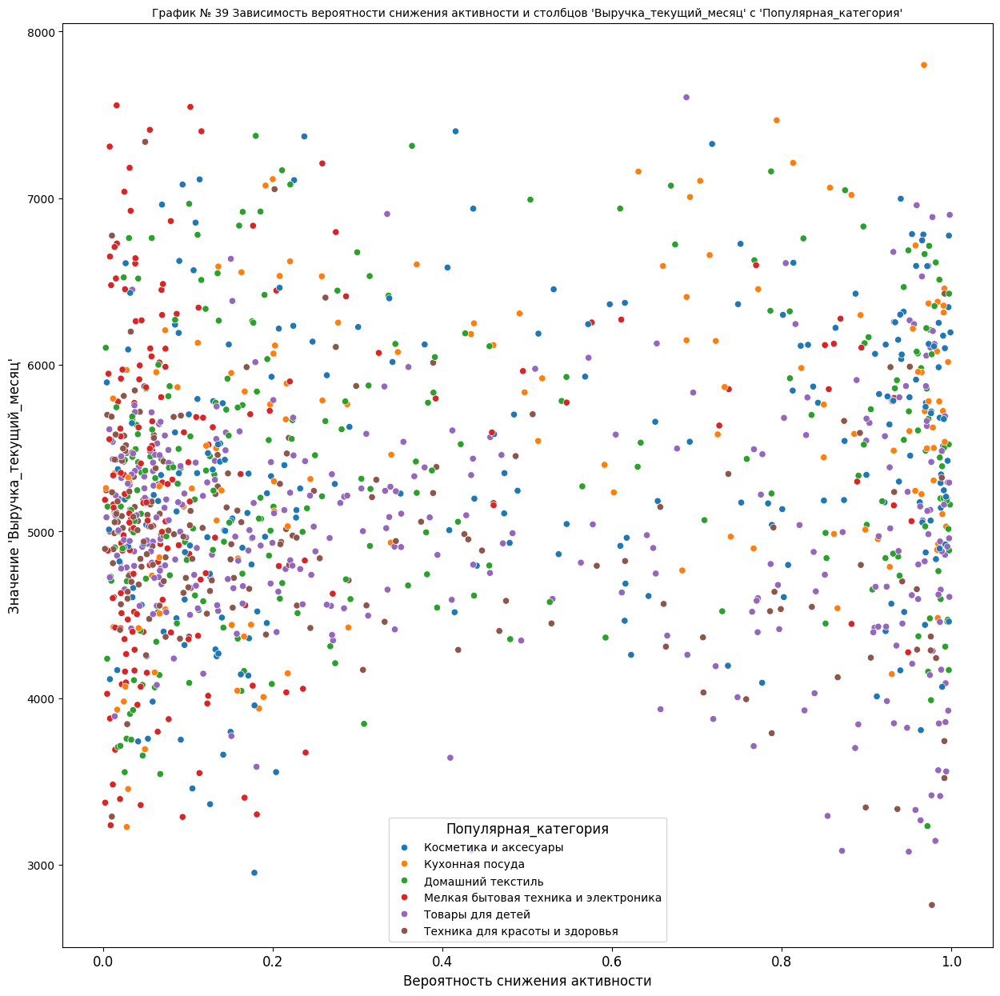

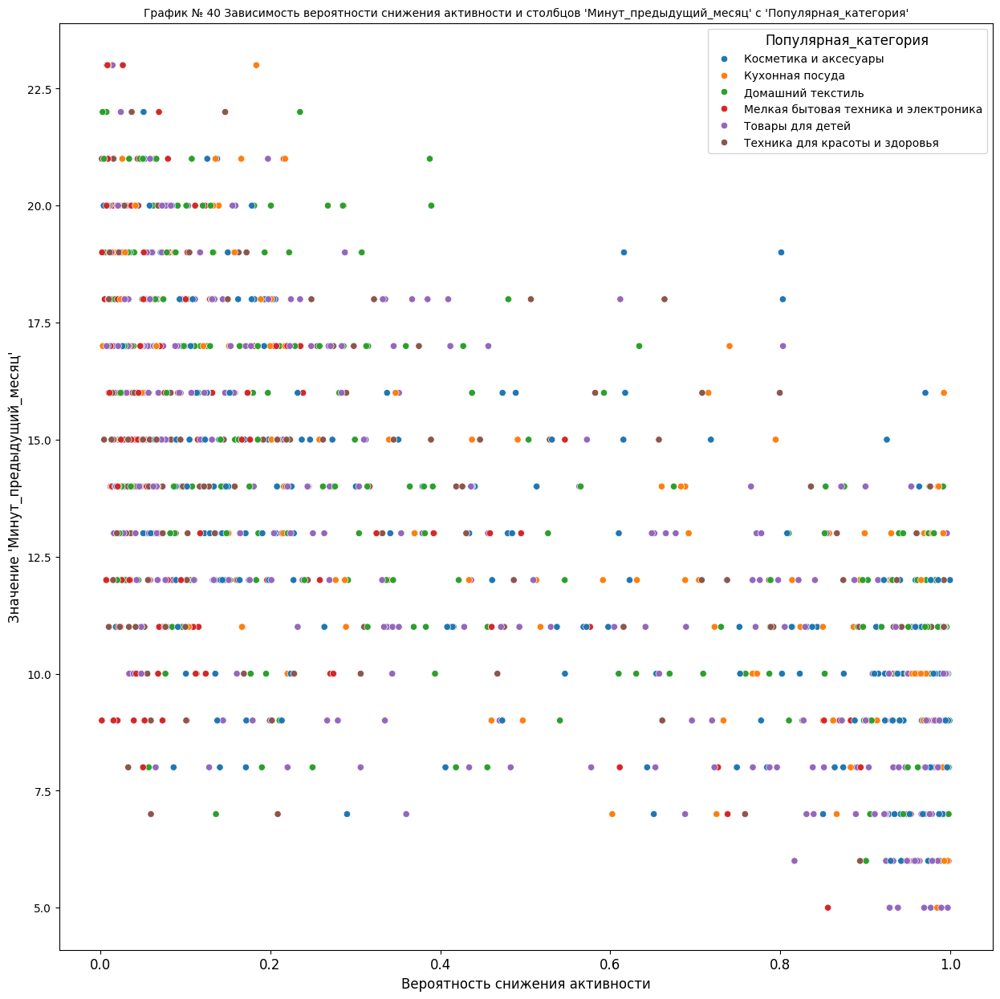

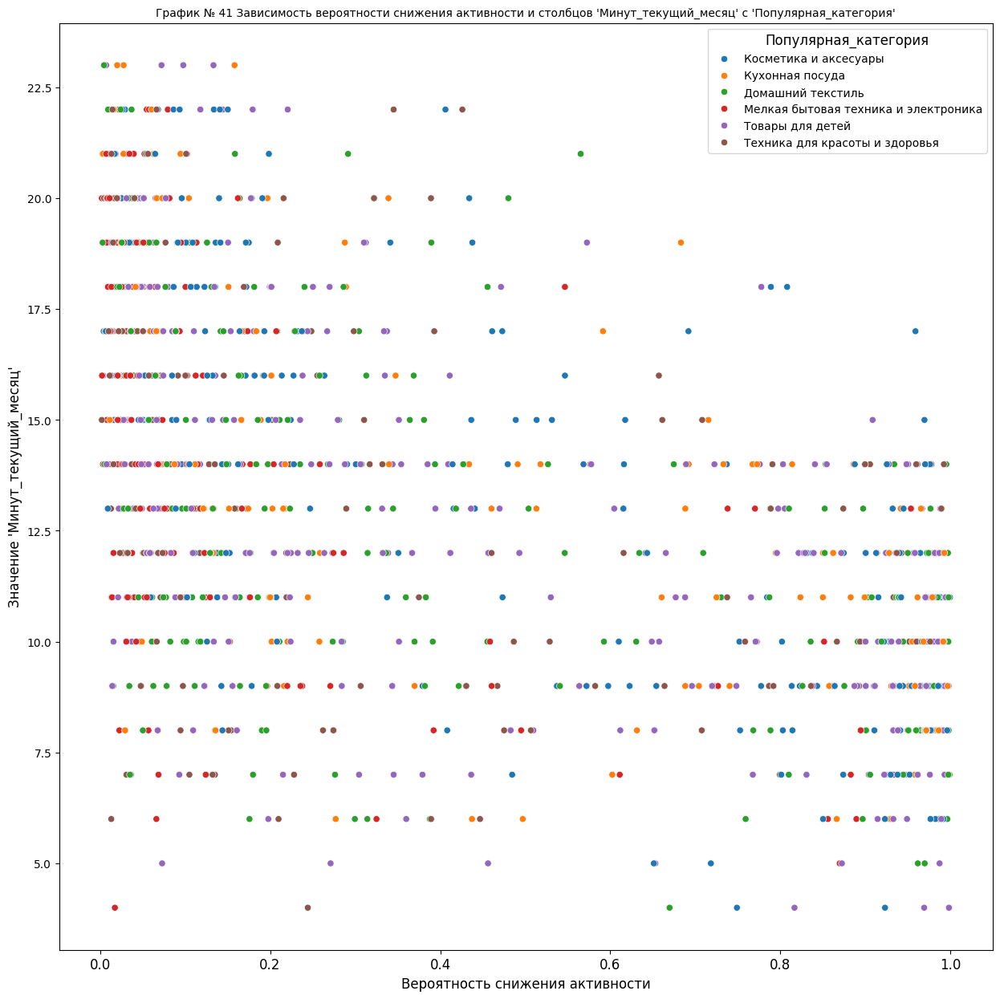

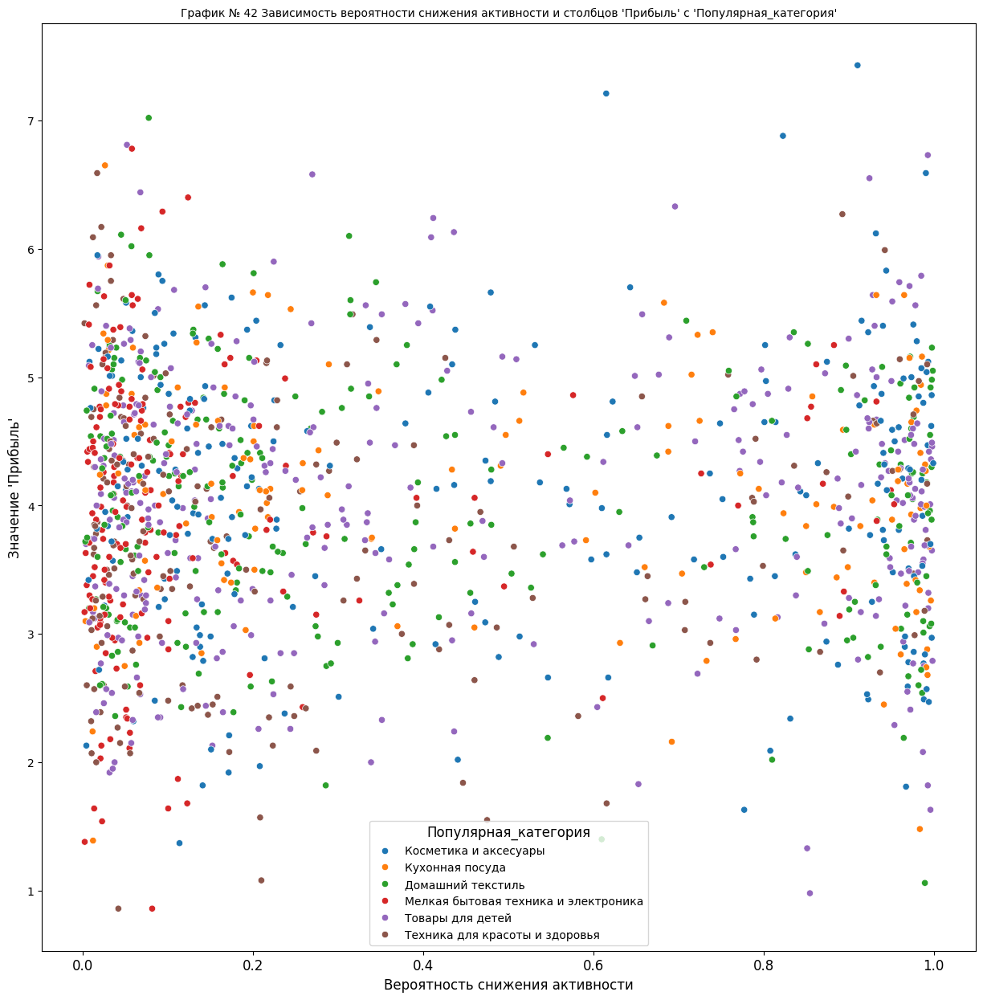

In [156]:
i = 0
for cat_col in cat_cols:
    for num_col in num_cols:

        fig = plt.figure(figsize=(15,15))
        sns.scatterplot(data=df_full, y=num_col, x=target_col, hue = cat_col)
        plt.xlabel('Вероятность снижения активности')
        plt.ylabel(f'Значение \'{num_col}\'')
        plt.title(f'График № {i+1} Зависимость вероятности снижения активности и cтолбцов \'{num_col}\' с \'{cat_col}\'')
        plt.show()
        i +=1

По результатам изучения графиков, мной сделаны следующие выводы:

1. Графики 29-40. Популярная у пользователя категория "мелкая бытовая техника и элоектроника" свидетельсвует, что активность пользователей вероятнее сохранится.
2. График 18. Прослеживается некоторая связь с акционными покупками и снижением активности. Часть пользователей покупают товары только по акции, после чего их активность падает.
3. График 21. Пользователи, которые просматривают мало страниц за визит, потеряют свою покупательскую активность.

Тогда логичным будет обратить внимание на пользователей, которые приносят выручку больше средней и вероятность снижения покупательской активности которых более 0.5. Попробовать выяснить причины и предложить способы по их удержанию.

In [157]:
df_Ffull = df_full[(df_full['Прибыль'] > df_full['Прибыль'].mean())&(df_full['вероятность_снижения']>0.5)]

In [158]:
df_Ffull.describe()

,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит,Выручка_предыдущий_месяц,Выручка_препредыдущий_месяц,Выручка_текущий_месяц,Минут_предыдущий_месяц,Минут_текущий_месяц,вероятность_снижения,Прибыль
count,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.00000,232.000000,232.000000,232.000000,232.000000,232.000000
mean,3.600862,4.056034,614.267241,0.493233,2.405172,3.939655,3.935345,4.556034,4922.678879,4571.50000,5313.380603,10.275862,10.284483,0.874745,4.739698
std,0.987322,0.684623,248.486844,0.314468,1.096855,2.205027,1.938480,2.282316,915.803928,490.74428,891.868768,2.787064,2.761222,0.127352,0.604021
min,0.900000,3.000000,110.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.00000,3078.300000,5.000000,4.000000,0.509526,4.000000
25%,3.075000,4.000000,446.750000,0.250000,2.000000,2.000000,2.000000,3.000000,4434.625000,4443.75000,4611.500000,8.000000,8.750000,0.800037,4.280000
50%,3.800000,4.000000,627.000000,0.320000,2.000000,4.000000,4.000000,4.000000,5039.000000,4608.50000,5360.000000,10.000000,10.000000,0.931151,4.635000
75%,4.100000,5.000000,808.750000,0.930000,3.000000,5.000000,5.000000,6.000000,5563.625000,4755.25000,6062.275000,12.000000,12.000000,0.972062,5.022500
max,5.600000,5.000000,1076.000000,0.990000,6.000000,10.000000,9.000000,14.000000,6400.000000,5532.00000,7467.900000,19.000000,21.000000,0.999282,7.430000


In [159]:
pivot_df2 = df_Ffull.pivot_table(
    index='Популярная_категория',
    values='вероятность_снижения',
    aggfunc='count'
).reset_index()


In [160]:
pivot_df2

,Популярная_категория,вероятность_снижения
0,Домашний текстиль,39
1,Косметика и аксесуары,55
2,Кухонная посуда,31
3,Мелкая бытовая техника и электроника,12
4,Техника для красоты и здоровья,20
5,Товары для детей,75


In [161]:
pivot_df = df_Ffull.pivot_table(
    index='Популярная_категория',
    values='вероятность_снижения',
    aggfunc='mean'
).reset_index()

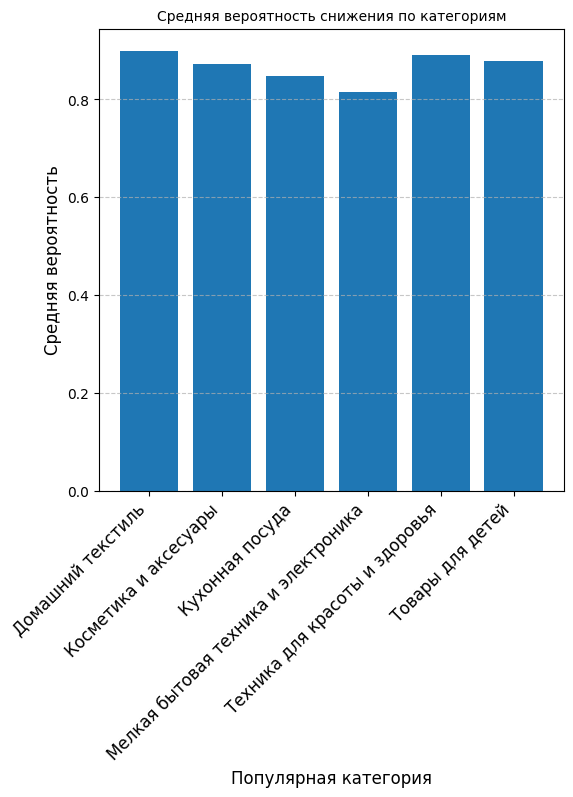

In [162]:
plt.figure(figsize=(6, 6))
plt.bar(
    x=pivot_df['Популярная_категория'],
    height=pivot_df['вероятность_снижения']

)


plt.title('Средняя вероятность снижения по категориям')
plt.xlabel('Популярная категория')
plt.ylabel('Средняя вероятность')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

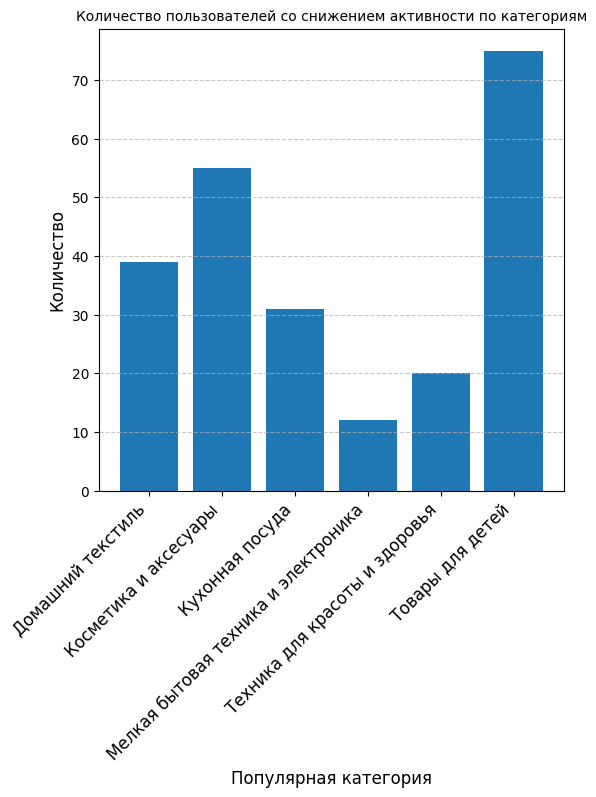

In [163]:
plt.figure(figsize=(6, 6))
plt.bar(
    x=pivot_df2['Популярная_категория'],
    height=pivot_df2['вероятность_снижения']

)


plt.title('Количество пользователей со снижением активности по категориям')
plt.xlabel('Популярная категория')
plt.ylabel('Количество')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

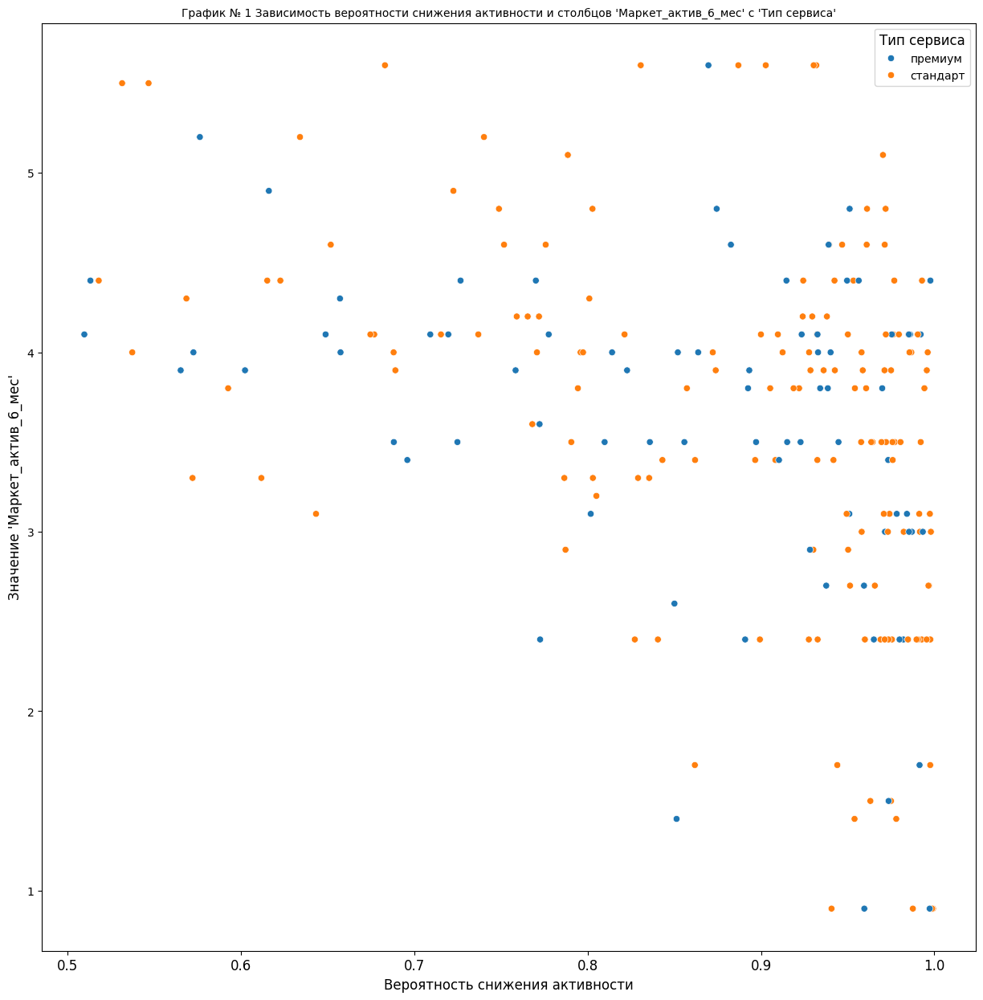

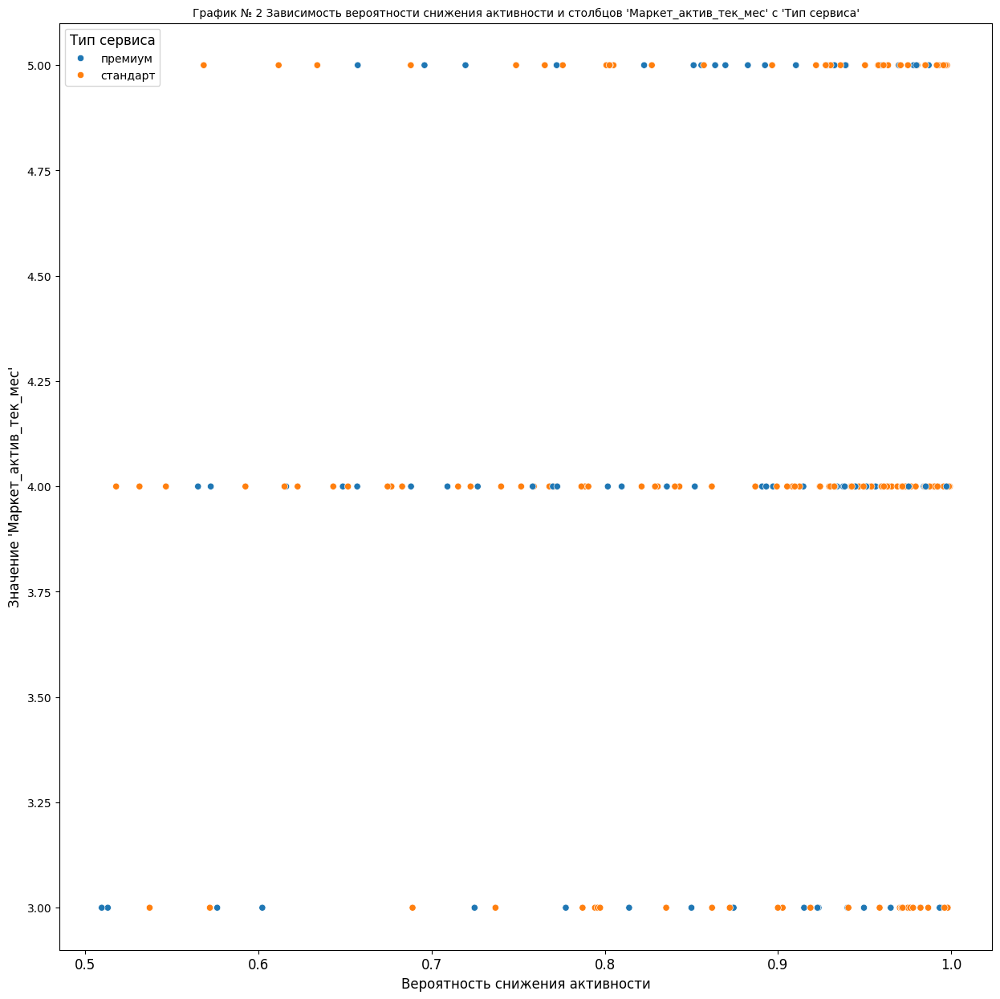

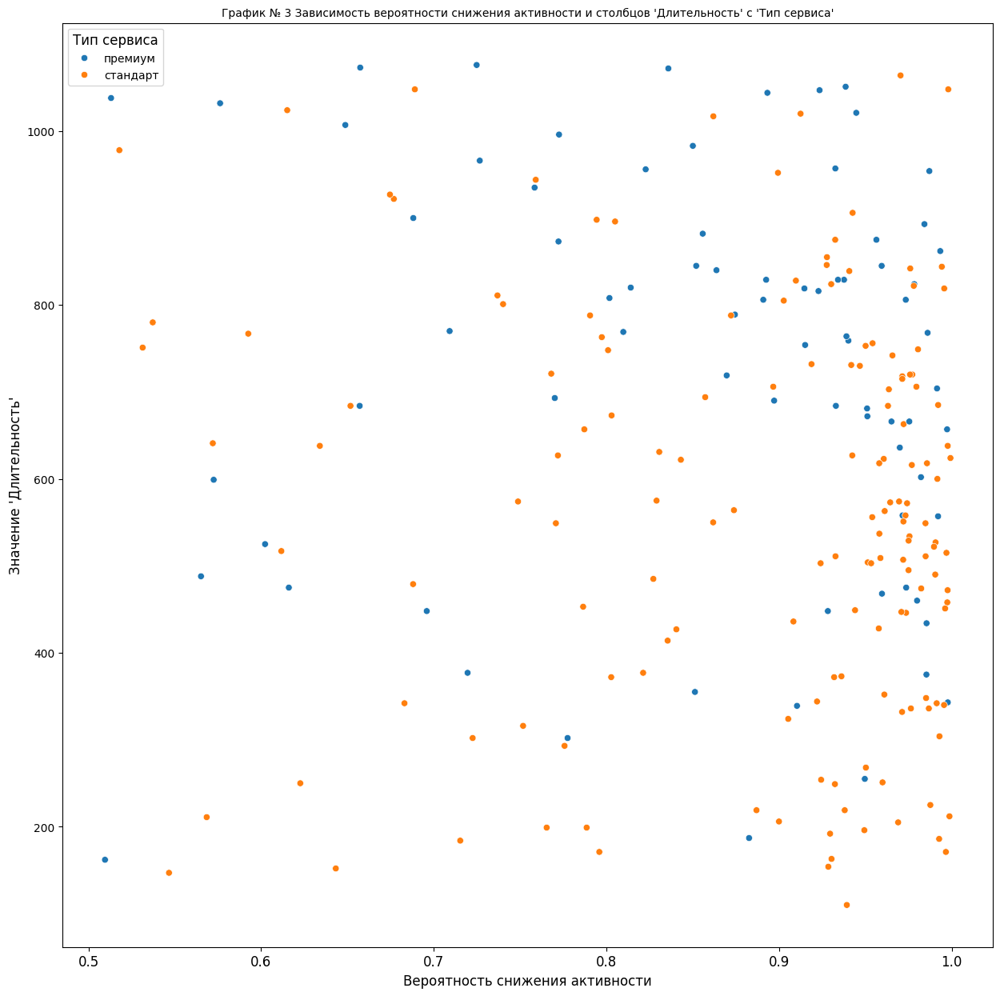

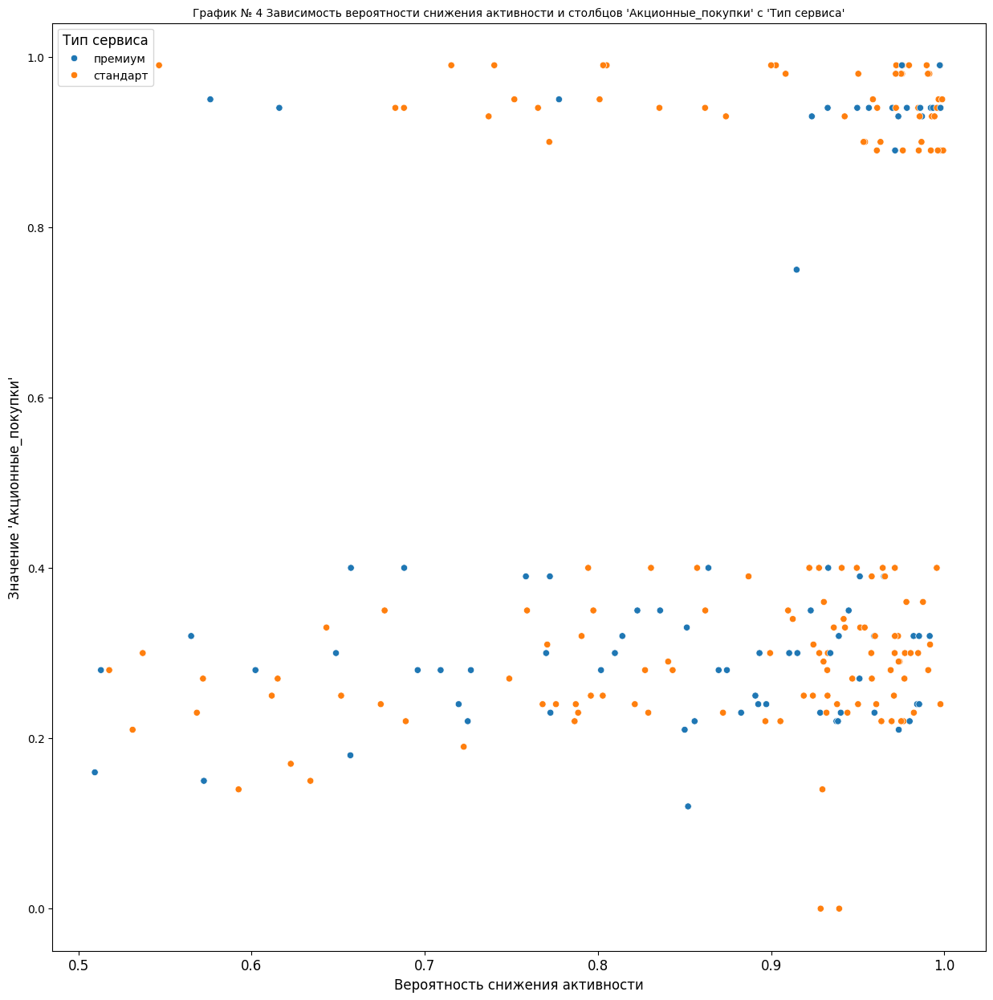

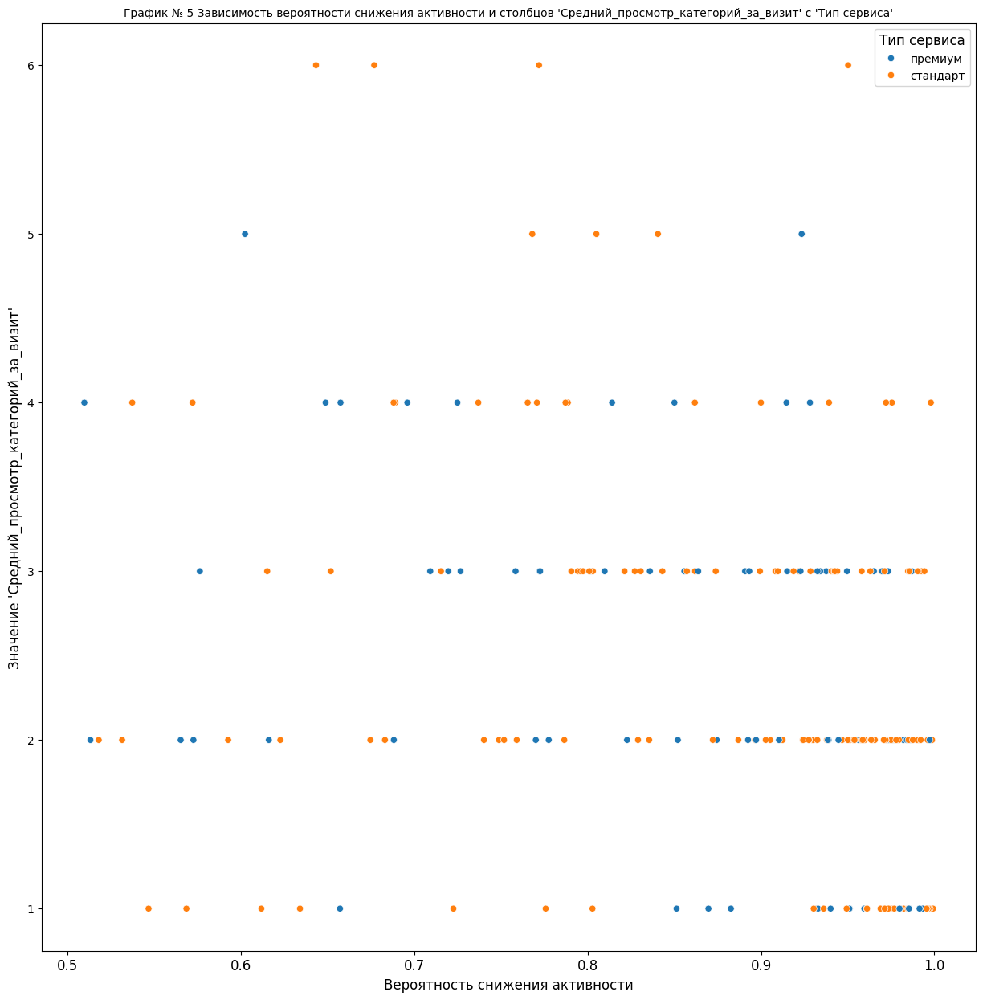

...

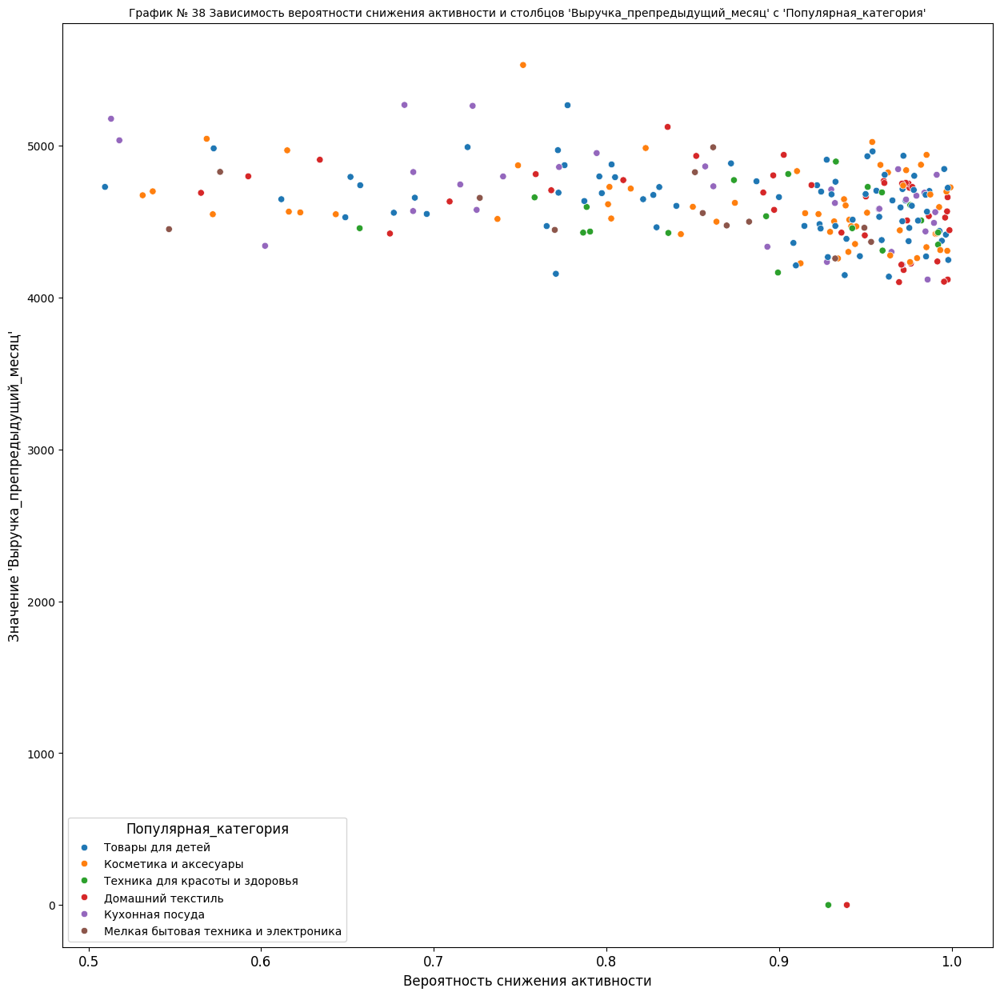

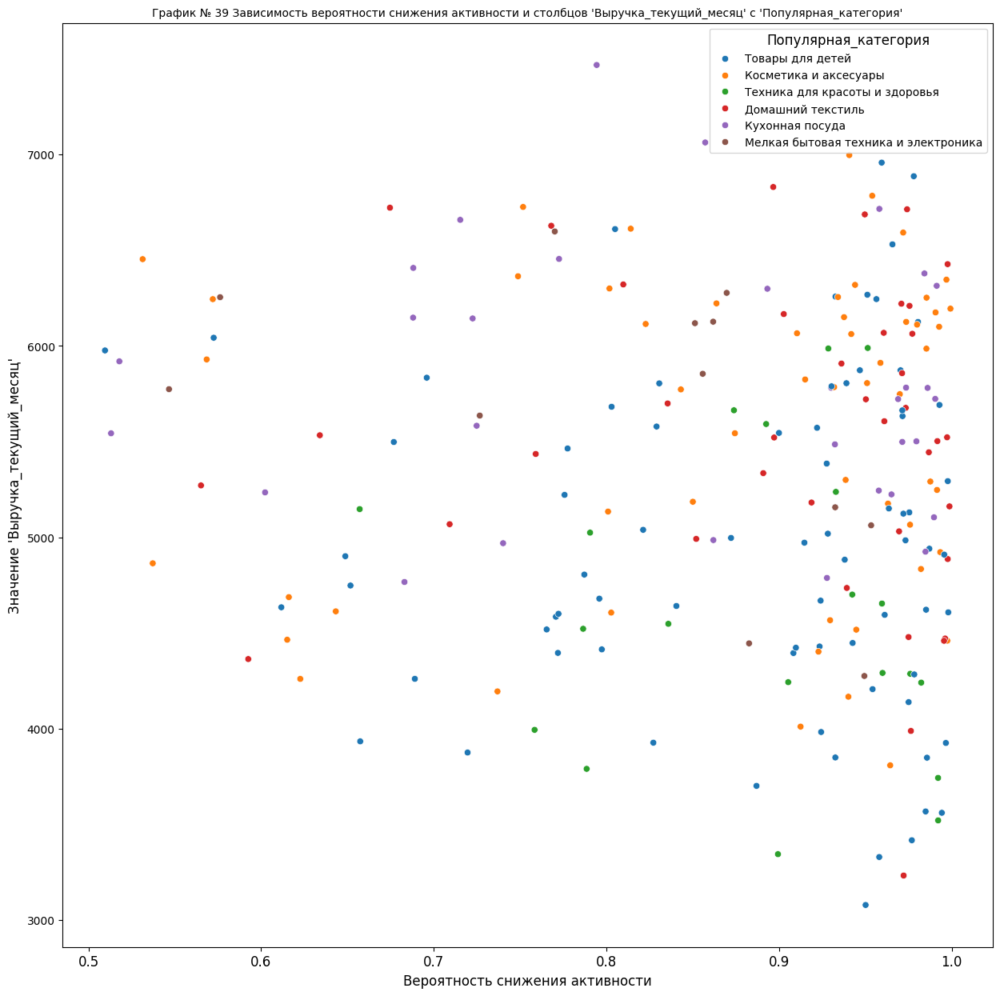

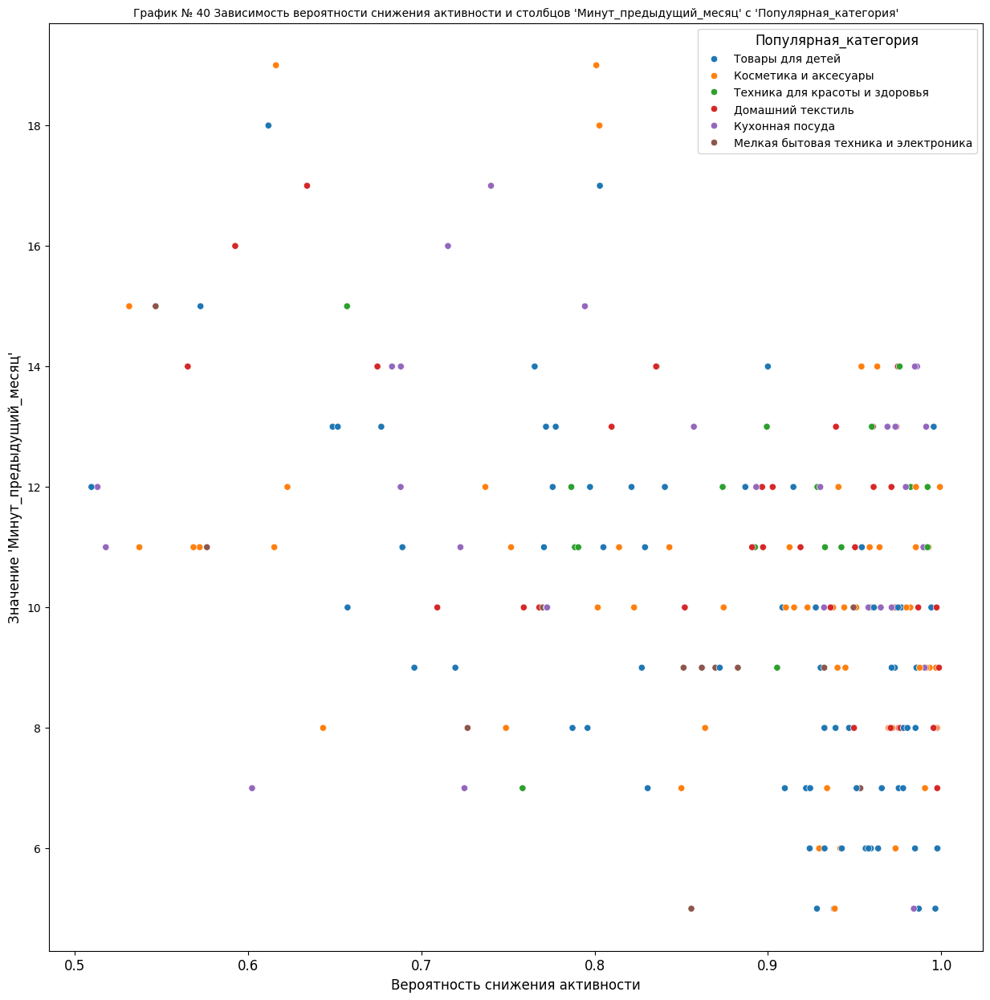

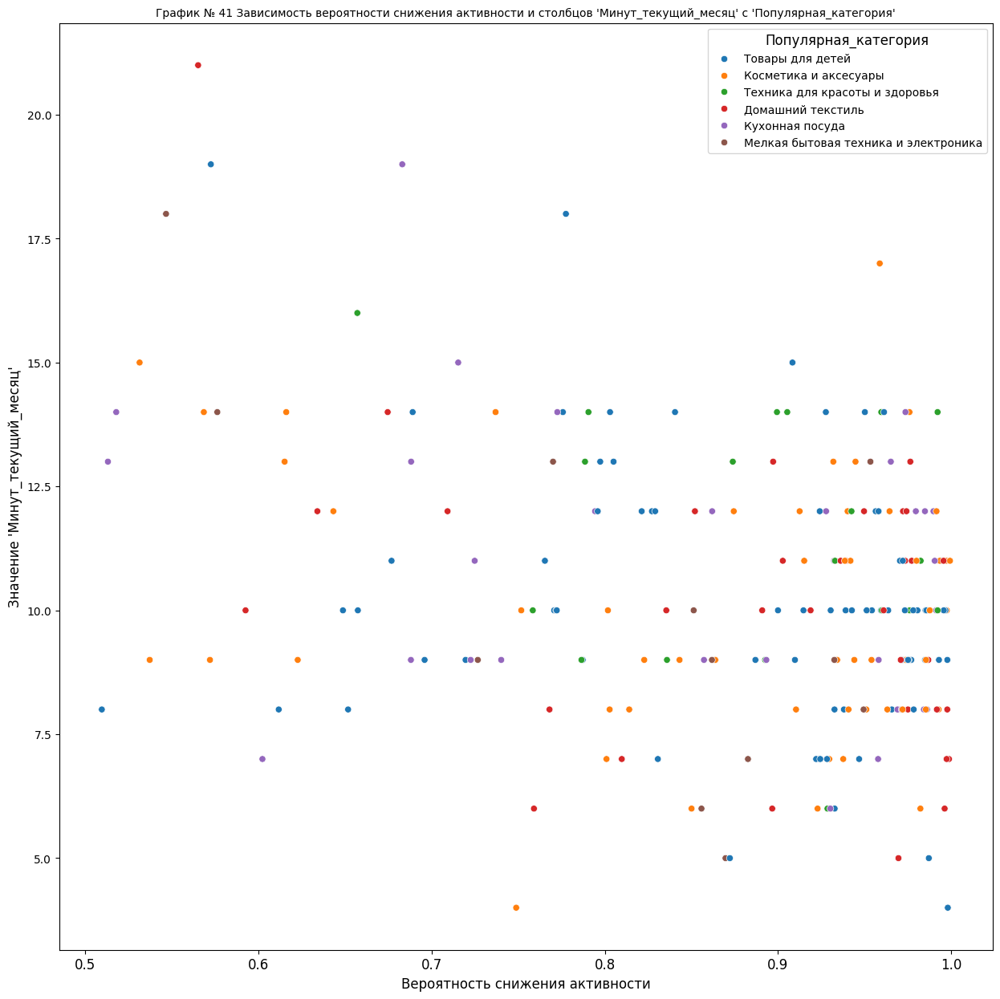

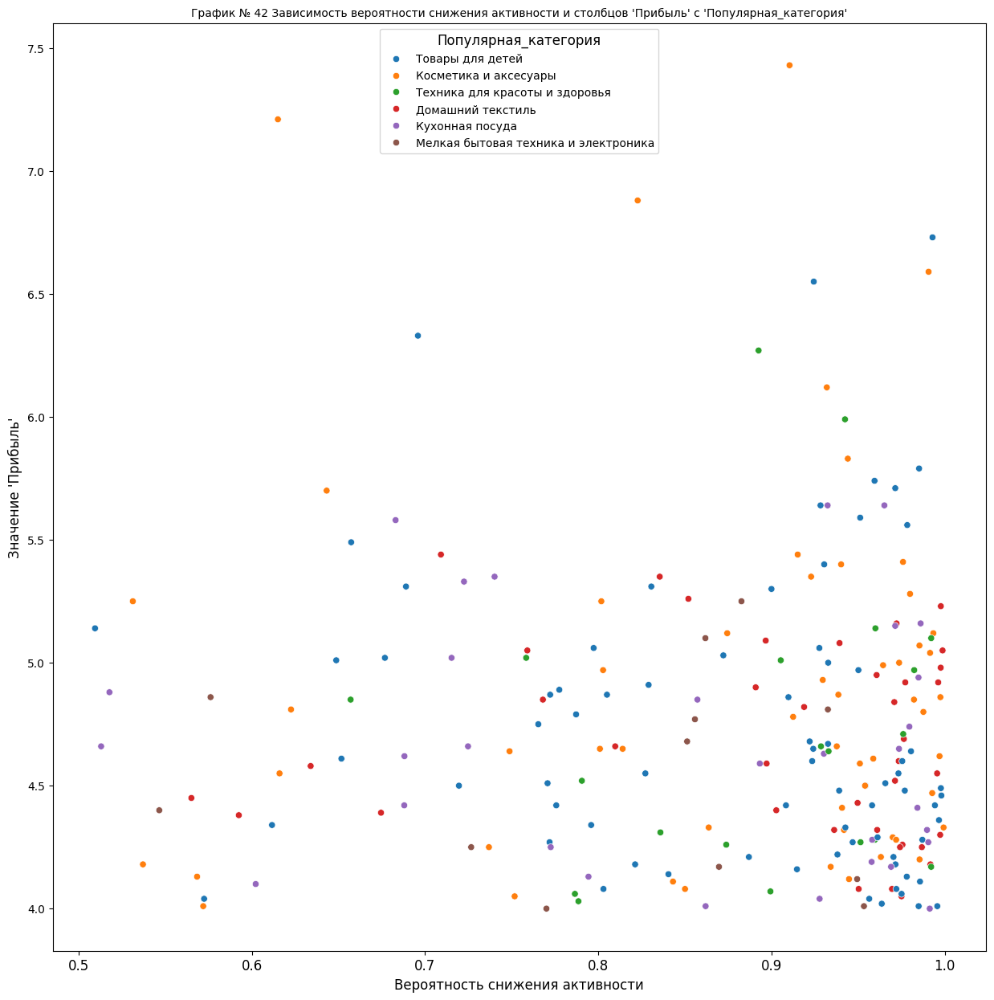

In [164]:
i = 0
#y = df_Ffull['']
for cat_col in cat_cols:
    for num_col in num_cols:

        fig = plt.figure(figsize=(15,15))
        sns.scatterplot(data=df_Ffull, y=num_col, x=target_col, hue = cat_col)
        plt.xlabel('Вероятность снижения активности')
        plt.ylabel(f'Значение \'{num_col}\'')
        plt.title(f'График № {i+1} Зависимость вероятности снижения активности и cтолбцов \'{num_col}\' с \'{cat_col}\'')
        plt.show()
        i +=1

Очевидных зависимостей не наблюдается. В количестве пользователей со снижением активности лидируют товары для детей, что может быть логично обусловлено их редкой потребностью. Прошлые выводы не поменялись, можно только рассмотреть новую категорию "товары для подростков", так как иных способов удержать пользователей с детьми не вижу.

# Шаг 9. Общий вывод
Сделайте общий вывод:


1) Перед проектом поставлена цель  "разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность".

2) Для достижения цели поставлены задачи:   
   1. построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.
   2. В исследование включить дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.
   3. Используя данные модели и данные о прибыльности клиентов, выделить сегменты покупателей и разработать для них персонализированные предложения.
3) Исходные данные представлены в виде 4 таблиц, содержащих данные о пользователях, их активнности, прибыли от них за разные периоды времени. Данные представлены в целом в качественном виде, однако для их предобработки были изменены типы данных, заменены символы ("," и "."), устранены опечатки и неявные дубликаты, с помощью сводной таблицы дыные приведены к одной общей информативной таблице.

4) Для поиска лучшей модели построен пайплайн, которые состоит из 3 шагов, на 1-2 предобрабатывает данные, использую разные кодировщики и стандартизацию, после чего перебирает 4 классические модели МО, и методом кросс-валдиации, случайным способом из списка выбирает гиперпараметры, показавшие лучшее качество на метрика ROC-AUC.

5) Лучше моделью получилась - логистическая регрессия с параметрами С=3 и l1 регуляризацией, которая обнулила влияние малозначимых признков.

6) По результатам исследования предлагается:
1. для сохранение активности уделить внимание пользователям, совершающим покупки по акциям, предложить им программу лояльности или использовать иные "акционные" способы привлечения их внимания.
2. уделить внимание пользователям с неоплаченными продуктами, также сделав им специализированные предложения.
3. делать специальные предложения пользователям, длительное время находящимся на сайте.